# Библиотеки

In [ ]:
import lightgbm as lgb
import matplotlib.pyplot as plt
import numpy as np
from numpy import mean
from numpy import std
import os
import pandas as pd
import seaborn as sns
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import LabelEncoder
from sklearn import preprocessing
from tqdm import tqdm
from matplotlib.ticker import MultipleLocator
import xgboost as xgb
import catboost

sns.set()

%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

from lightgbm import LGBMClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV

# Пользовательские функции

In [ ]:
def reduce_mem_usage(df):
    """
    Сжатие датасета с помощью преобразования типов
    """

    NAlist = [] # Keeps track of columns that have missing values filled in. 
    for col in tqdm(df.columns):
        if df[col].dtype != object:  # Exclude strings

            # make variables for Int, max and min
            IsInt = False
            col_max_value = df[col].max()
            col_min_value = df[col].min()

            # Integer does not support NA, therefore, NA needs to be filled
            if not np.isfinite(df[col]).all(): 
                NAlist.append(col)
                df[col].fillna(col_min_value - 1, inplace=True)

            # test if column can be converted to an integer
            col_as_int = df[col].fillna(0).astype(np.int64)
            diff = (df[col] - col_as_int)
            diff = diff.sum()
            if np.abs(diff) < 0.01:
                IsInt = True

            # Make Integer/unsigned Integer datatypes
            if IsInt:
                if col_min_value >= 0:
                    if col_max_value < 255:
                        df[col] = df[col].astype(np.uint8)
                    elif col_max_value < 65535:
                        df[col] = df[col].astype(np.uint16)
                    elif col_max_value < 4294967295:
                        df[col] = df[col].astype(np.uint32)
                    else:
                        df[col] = df[col].astype(np.uint64)
                else:
                    if col_min_value > np.iinfo(np.int8).min and col_max_value < np.iinfo(np.int8).max:
                        df[col] = df[col].astype(np.int8)
                    elif col_min_value > np.iinfo(np.int16).min and col_max_value < np.iinfo(np.int16).max:
                        df[col] = df[col].astype(np.int16)
                    elif col_min_value > np.iinfo(np.int32).min and col_max_value < np.iinfo(np.int32).max:
                        df[col] = df[col].astype(np.int32)
                    elif col_min_value > np.iinfo(np.int64).min and col_max_value < np.iinfo(np.int64).max:
                        df[col] = df[col].astype(np.int64)    

            # Make float datatypes 32 bit
            else:
                df[col] = df[col].astype(np.float32)

    return df, NAlist

In [ ]:
def findnull(df):
    """
    Поиск пропусков в датасете
    """

    df_null = pd.DataFrame(df.dtypes, columns=['dtypes'])
    df_null = df_null.reset_index()
    df_null['Name'] = df_null['index']
    df_null = df_null[['Name','dtypes']]
    df_null['Missing(%)'] = df.isnull().sum().values / df.shape[0]*100  
    df_null['Uniques'] = df.nunique().values
    
    
    return df_null

In [ ]:
def plot_corr_matrix(
    matrix: pd.DataFrame,
    figsize: (int, int),
    cmap=sns.diverging_palette(245, 10, s=80, l=50, as_cmap=True),
    annot=True,
    fontsize=10,
    cbar_orient='horizontal',
    cbar=True
):
    if cbar:
        grid_kws = {"height_ratios": (.9, .01), "hspace": .16}
        f, (ax, cbar_ax) = plt.subplots(2, gridspec_kw=grid_kws, figsize=figsize)
    else:
        f, ax = plt.subplots(1, figsize=figsize)
        cbar_ax=None
        cbar_kws=None

    ax = sns.heatmap(
        matrix, 
        square=False, 
        cmap=cmap, 
        annot=annot, 
        fmt='.2f', 
        linewidths=.5, 
        ax=ax, 
        cbar=cbar,
        cbar_ax=cbar_ax, 
        cbar_kws={"orientation": cbar_orient},
        annot_kws={'fontsize': fontsize})

    plt.tight_layout()
    plt.show()

In [ ]:
def remove_hicorr_features(data: pd.DataFrame, matrix: pd.DataFrame, threshold: int, target: str):
    
    y = data[target]
    data = data.drop(columns = [target])
    
    corr_matrix = matrix
    iters = range(len(corr_matrix.columns) - 1)
    drop_cols = []

    for i in iters:
        for j in range(i+1):
            item = corr_matrix.iloc[j:(j+1), (i+1):(i+2)]
            col = item.columns
            row = item.index
            val = abs(item.values)
            
            if val >= threshold:
                # print(col.values[0], "|", row.values[0], "|", round(val[0][0], 2))
                drop_cols.append(col.values[0])
            
    drops = set(drop_cols)
    data = data.drop(columns = drops)
            
    data[target] = y
               
    return data, drops

# **1. Загрузка данных**

In [ ]:
!wget --no-check-certificate 'https://www.dropbox.com/s/5iuef7c9ljj84t6/train_transaction.csv?dl=0' -O train_transaction.csv
!wget --no-check-certificate 'https://www.dropbox.com/s/cmy01z5fw7ohlmd/train_identity.csv?dl=0' -O train_identity.csv
!wget --no-check-certificate 'https://www.dropbox.com/s/7thqkuxnwsa7njj/test_transaction.csv?dl=0' -O test_transaction.csv
!wget --no-check-certificate 'https://www.dropbox.com/s/b40nvbb9e2usd5w/test_identity.csv?dl=0' -O test_identity.csv
!wget --no-check-certificate 'https://www.dropbox.com/s/arkyoz0bel8z4d2/sample_submission.csv?dl=0' -O sample_submission.csv

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
INPUT_DIR = '.'
# INPUT_DIR = '/content/drive/MyDrive/Colab Notebooks/Групповое задание 2/Data'

train_transaction = pd.read_csv(os.path.join(INPUT_DIR, 'train_transaction.csv'))
train_identity = pd.read_csv(os.path.join(INPUT_DIR, 'train_identity.csv'))
test_transaction = pd.read_csv(os.path.join(INPUT_DIR, 'test_transaction.csv'))
test_identity = pd.read_csv(os.path.join(INPUT_DIR, 'test_identity.csv'))
# sample_submission = pd.read_csv(os.path.join(INPUT_DIR, 'sample_submission.csv'))

In [ ]:
print(
    'train_transaction: ', train_transaction.memory_usage(index=True, deep=True).sum() / (1024*1024), 'Mb\n',
    'train_identity: ', train_identity.memory_usage(index=True, deep=True).sum() / (1024*1024), 'Mb\n',
    'test_transaction: ', test_transaction.memory_usage(index=True, deep=True).sum() / (1024*1024), 'Mb\n',
    'test_identity: ', test_identity.memory_usage(index=True, deep=True).sum() / (1024*1024), 'Mb\n',
)

train_transaction:  1494.7065439224243 Mb
 train_identity:  124.528076171875 Mb
 test_transaction:  627.1281633377075 Mb
 test_identity:  37.408586502075195 Mb



Данные занимают больше 2 Гб в памяти, что может сильно сказаться на скорости обучения

# **2. Подготовка датасета**

Как видно, данные занимают достаточно много памяти, сожмем их, изменив тип некоторых признаков:

In [ ]:
df_train_orig = train_transaction.merge(train_identity, how='left', on='TransactionID')
del train_transaction, train_identity
df_train_orig, df_train_NAlist = reduce_mem_usage(df_train_orig)

100%|██████████| 434/434 [01:00<00:00,  7.17it/s]


In [ ]:
df_test_orig = test_transaction.merge(test_identity, how='left', on='TransactionID')
del test_transaction, test_identity
df_test_orig, df_test_NAlist = reduce_mem_usage(df_test_orig)

100%|██████████| 433/433 [00:25<00:00, 17.04it/s] 


# **3. Проверка и заполнение пропусков**

In [ ]:
df_train = df_train_orig.copy()
df_test = df_test_orig.copy()

В данных есть пропуски:

In [ ]:
print('Missing data in train: {:.5f}%'.format(df_train.isnull().sum().sum() / (df_train.shape[0] * df_train.shape[1]) * 100))
print('Missing data in test: {:.5f}%'.format(df_test.isnull().sum().sum() / (df_test.shape[0] * df_test.shape[1]) * 100))

Missing data in train: 4.47002%
Missing data in test: 4.33051%


In [ ]:
train_null = findnull(df_train)

#аналогично поступим с тестовым датасетом
test_null = findnull(df_test)

display(train_null.sort_values(by=['Missing(%)'], ascending=False).head(30),
        test_null.sort_values(by=['Missing(%)'], ascending=False).head(20))

,Name,dtypes,Missing(%),Uniques
420,id_27,object,99.053068,2
416,id_23,object,99.053068,3
426,id_33,object,86.153095,183
423,id_30,object,85.128808,71
427,id_34,object,85.111565,4
433,DeviceInfo,object,77.977004,1551
409,id_16,object,76.149478,2
16,R_emaildomain,object,75.136448,60
424,id_31,object,74.144732,110
432,DeviceType,object,74.105695,2


,Name,dtypes,Missing(%),Uniques
419,id_27,object,99.297611,2
415,id_23,object,99.297611,3
422,id_30,object,91.057399,72
425,id_33,object,91.056821,185
426,id_34,object,90.960279,3
432,DeviceInfo,object,84.560732,1033
408,id_16,object,82.801579,2
423,id_31,object,81.315289,106
431,DeviceType,object,81.104283,2
421,id_29,object,81.093299,2


In [ ]:
#количество уникальных значений по столбцам в тренировочном датасете
train_null.sort_values(by=['Uniques'], ascending=True).head()

,Name,dtypes,Missing(%),Uniques
161,V107,uint8,0.000000,1
422,id_29,object,74.070012,2
48,M3,object,53.511719,2
47,M2,object,53.511719,2
46,M1,object,53.511719,2


In [ ]:
#количество уникальных значений по столбцам в тестовом датасете
test_null.sort_values(by=['Uniques'], ascending=True).head()

,Name,dtypes,Missing(%),Uniques
408,id_16,object,82.801579,2
431,DeviceType,object,81.104283,2
53,M9,object,39.419358,2
50,M6,object,23.009463,2
49,M5,object,56.935155,2


In [ ]:
#удалим столбцы с пропусками более 85% для тренировочного
#df_train.drop(columns=['id_27', 'id_23', 'id_30', 'id_33', 'id_34'], inplace=True)
#удалим столбцы с пропусками более 60% для тренировочного
df_train.drop(columns=train_null[train_null['Missing(%)'] > 85]['Name'].tolist(), inplace=True, errors='ignore')
df_train.drop(columns=test_null[train_null['Missing(%)'] > 85]['Name'].tolist(), inplace=True, errors='ignore')

df_test.drop(columns=train_null[train_null['Missing(%)'] > 85]['Name'].tolist(), inplace=True, errors='ignore')
df_test.drop(columns=test_null[train_null['Missing(%)'] > 85]['Name'].tolist(), inplace=True, errors='ignore')

In [ ]:
#удалим столбец с одним уникальным значением V107
df_train.drop(columns=['V107'], inplace=True)
df_test.drop(columns=['V107'], inplace=True)

В тестовом датасете признаки с одним уникальным значением, как в тренировочном, отсутствуют.

Заполним пропуски в столбцах, где значения выражаются числами - `-1`, а где строками - `'unseen_category'`.


In [ ]:
#список категориальных признаков
#cat_features = [col for col in df_train.columns if df_train[col].dtype == 'object']
# Формирование по типу данных исключает из категориальных фич поля card с трехзначным число, лучше вручную:
cat_features = ['ProductCD',
                'card1',
                'card2',
                'card3',
                'card4',
                'card5',
                'card6',
                'addr1',
                'addr2',
                'P_emaildomain',
                'R_emaildomain',
                'M1',
                'M2',
                'M3',
                'M4',
                'M5',
                'M6',
                'M7',
                'M8',
                'M9',
                'DeviceType',
                'DeviceInfo',
                'id_12',
                'id_13',
                'id_14',
                'id_15',
                'id_16',
                'id_17',
                'id_18',
                'id_19',
                'id_20',
                'id_21',
                'id_22',
                'id_23',
                'id_24',
                'id_25',
                'id_26',
                'id_27',
                'id_28',
                'id_29',
                'id_30',
                'id_31',
                'id_32',
                'id_33',
                'id_34',
                'id_35',
                'id_36',
                'id_37',
                'id_38']

In [ ]:
for col in df_train.columns.drop('isFraud'):
    if col in cat_features:
        df_train[col] = df_train[col].fillna('unseen_category')
        df_test[col] = df_test[col].fillna('unseen_category')
    else:
        df_train[col] = df_train[col].fillna(-1)
        df_test[col] = df_test[col].fillna(-1)

print('Missing data in train: {:.5f}%'.format(df_train.isnull().sum().sum() / (df_train.shape[0] * df_train.shape[1]) * 100))
print('Missing data in test: {:.5f}%'.format(df_test.isnull().sum().sum() / (df_test.shape[0] * df_test.shape[1]) * 100))

Missing data in train: 0.00000%
Missing data in test: 0.00000%


# **4. Анализ признаков**

### **Признак ```TransactionDT```**

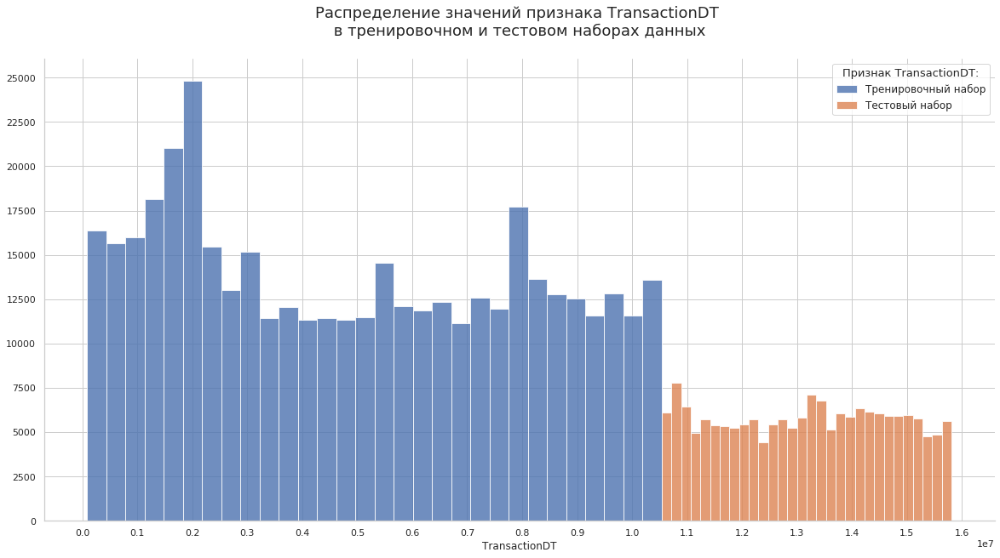

In [ ]:
sns.set_style('whitegrid')
sns.set_context(rc = {'lines.linewidth': 3})

fig, ax = plt.subplots(figsize=(20,10))
# plt.subplot()

plt.title('Распределение значений признака TransactionDT \n в тренировочном и тестовом наборах данных \n', fontsize=18)
sns.distplot(df_train['TransactionDT'], label='Тренировочный набор', bins=30, ax=ax, kde=False, hist_kws={'alpha': 0.8})
sns.distplot(df_test['TransactionDT'], label='Тестовый набор', bins=30, ax=ax, kde=False, hist_kws={'alpha': 0.8})
plt.legend(title='Признак TransactionDT:', loc='best', title_fontsize=13, fontsize=12)
ax.xaxis.set_major_locator(MultipleLocator(10e+5))
ax.yaxis.set_major_locator(MultipleLocator(2500))
sns.despine()
plt.show()

In [ ]:
df_train['TransactionDT'].min(), df_test['TransactionDT'].max(), df_test['TransactionDT'].max() - df_train['TransactionDT'].min()

(86400, 15811131, 15724731)

Можно предположить, что время для этого признака измеряется в секундах, тогда похоже на то, что данные из трейна и теста - это данные за полгода.

Также, если время измеряется в секундах, то, судя по всему, обучающая часть выборки включает в себя данные за 4 месяца, а тестовая - за следующие 2:

In [ ]:
(df_train['TransactionDT'].max() - df_train['TransactionDT'].min()) / (3600 * 24), (df_test['TransactionDT'].max() - df_test['TransactionDT'].min()) / (3600 * 24)

(120.99996527777778, 60.998900462962965)

In [ ]:
#переведем секунды в дни недели
df_train['day'] = np.ceil(df_train['TransactionDT'] / (3600 * 24)) % 7 + 1
df_test['day'] = np.ceil(df_test['TransactionDT'] / (3600 * 24)) % 7 + 1

In [ ]:
df_train_day = df_train.groupby('isFraud')['day'].value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('day')
df_test_day = df_test['day'].value_counts(normalize=True).rename('percentage').mul(100).reset_index()
df_test_day = df_test_day.rename({'index':'day'}, axis='columns')

No handles with labels found to put in legend.


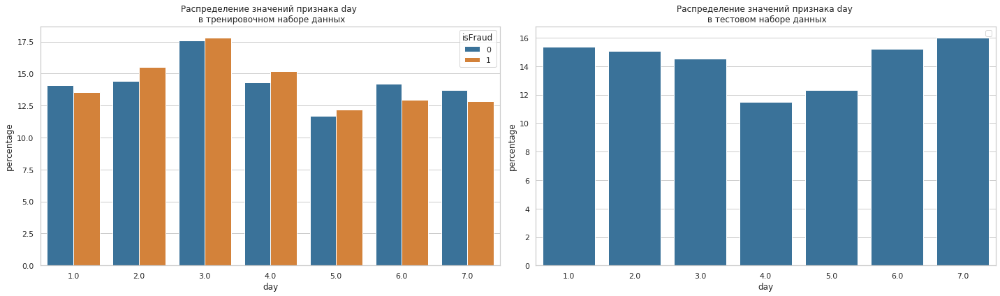

In [ ]:
#построим распределение транзакций по дням недели
plt.figure(figsize=(20,6))
plt.subplot(1,2,1)
plt.title('Распределение значений признака day \n в тренировочном наборе данных')
#plt.xticks(fontsize = 8)
sns.barplot(df_train_day['day'], df_train_day['percentage'], hue=df_train_day['isFraud'], data=df_train_day, palette=sns.color_palette('tab10', n_colors=2, desat=0.85))
plt.subplot(1,2,2)
plt.title('Распределение значений признака day \n в тестовом наборе данных')
#plt.xticks(fontsize = 8)
sns.barplot(df_test_day['day'], df_test_day['percentage'], data=df_test_day, palette=sns.color_palette('tab10', n_colors=1, desat=0.85))
plt.legend()
plt.tight_layout()
plt.show()

Фишинговые транзакции совершались каждый день, зависимости от дня недели нету.

In [ ]:
#переведем секунды в часы
df_train['hour'] = np.ceil(df_train['TransactionDT'] / 3600) % 24
df_test['hour'] = np.ceil(df_test['TransactionDT'] / 3600) % 24 

In [ ]:
df_train_hour = df_train.groupby('isFraud')['hour'].value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('hour')
df_test_hour = df_test['hour'].value_counts(normalize=True).rename('percentage').mul(100).reset_index()
df_test_hour = df_test_hour.rename({'index':'hour'}, axis='columns')

No handles with labels found to put in legend.


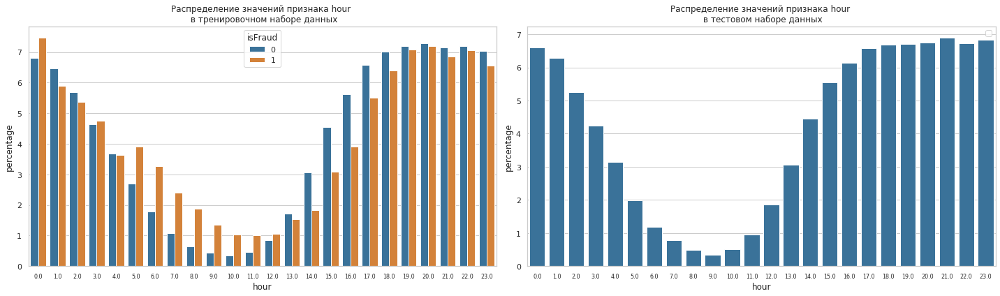

In [ ]:
#построим распределение транзакций по часам
plt.figure(figsize=(20,6))
plt.subplot(1,2,1)
plt.title('Распределение значений признака hour \n в тренировочном наборе данных')
plt.xticks(fontsize = 8)
sns.barplot(df_train_hour['hour'], df_train_hour['percentage'], hue=df_train_hour['isFraud'], data=df_train_hour, palette=sns.color_palette('tab10', n_colors=2, desat=0.85))
plt.subplot(1,2,2)
plt.title('Распределение значений признака hour \n в тестовом наборе данных')
plt.xticks(fontsize = 8)
sns.barplot(df_test_hour['hour'], df_test_hour['percentage'], data=df_test_hour, palette=sns.color_palette('tab10', n_colors=1, desat=0.85))
plt.legend()
plt.tight_layout()
plt.show()

Наибольшее количество фишинговых транзакций приходится на время с 17 вечера до 3 часов ночи, наименьшее с 9 до 12.

In [ ]:
#добавим новый параметр 
def new_hour_feature(hour):
    if (hour>16 and hour<=23) or (hour>=0 and hour<4):
        return 'hight'
    if (hour>=4 and hour<9) or (hour>=13 and hour<17):
        return 'medium'
    if hour>=9 and hour<13:
        return 'low'       

In [ ]:
df_train['froud_probability'] = df_train['hour'].apply(new_hour_feature)
df_test['froud_probability'] = df_test['hour'].apply(new_hour_feature)

### **Признак ```TransactionAmt```**

No handles with labels found to put in legend.


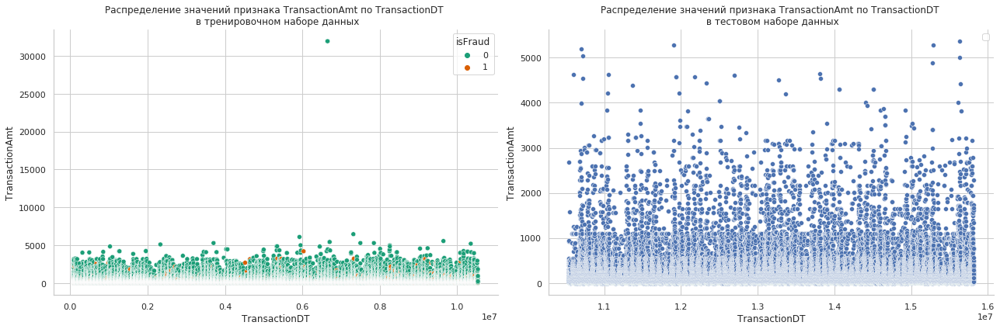

In [ ]:
#посторим распределение TransactionAmt по времени TransactionDT
plt.figure(figsize=(18,6))
plt.subplot(1,2,1)
plt.title('Распределение значений признака TransactionAmt по TransactionDT \n в тренировочном наборе данных')
sns.scatterplot(df_train['TransactionDT'], df_train['TransactionAmt'], hue=df_train['isFraud'], palette='Dark2')
plt.subplot(1,2,2)
plt.title('Распределение значений признака TransactionAmt по TransactionDT \n в тестовом наборе данных')
sns.scatterplot(df_test['TransactionDT'], df_test['TransactionAmt'], palette='Dark2')
plt.legend()
plt.tight_layout()
sns.despine()
plt.show()

In [ ]:
#удалим выброс
df_train.drop(df_train[df_train.TransactionAmt>10000].index, axis=0, inplace=True)

No handles with labels found to put in legend.


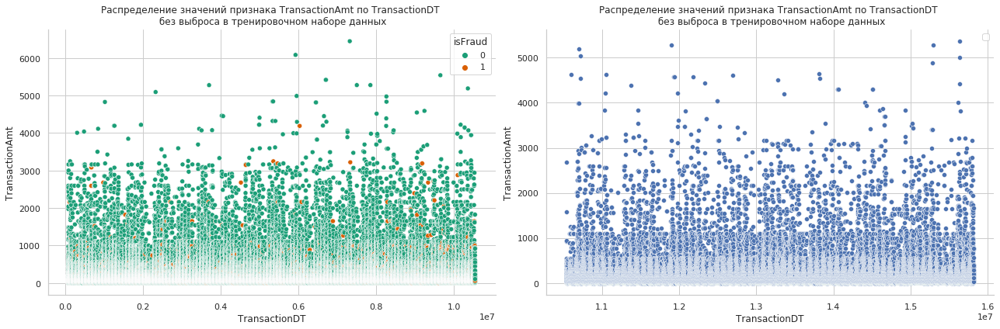

In [ ]:
#посторим распределение TransactionAmt по времени TransactionDT без выброса
plt.figure(figsize=(18,6))
plt.subplot(1,2,1)
plt.title('Распределение значений признака TransactionAmt по TransactionDT \n без выброса в тренировочном наборе данных')
sns.scatterplot(df_train['TransactionDT'], df_train['TransactionAmt'], hue=df_train['isFraud'], palette='Dark2')
plt.subplot(1,2,2)
plt.title('Распределение значений признака TransactionAmt по TransactionDT \n без выброса в тренировочном наборе данных')
sns.scatterplot(df_test['TransactionDT'], df_test['TransactionAmt'], palette='Dark2')
plt.legend()
plt.tight_layout()
sns.despine()
plt.show()

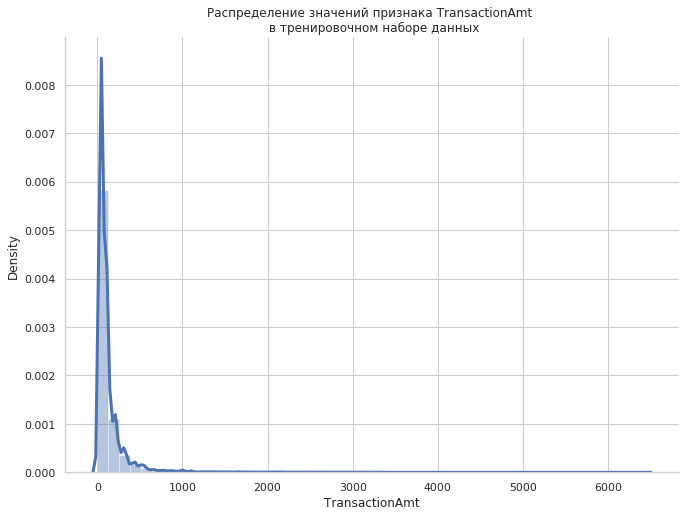

In [ ]:
#посмотрим на распределение признака в трейне
plt.figure(figsize=(11, 8))
plt.title('Распределение значений признака TransactionAmt \n в тренировочном наборе данных')
sns.distplot(df_train['TransactionAmt'])
sns.despine()
plt.show()

Как видно, распределение очень сильно смещено. Прологарифмируем признак и добавим результат в данные как новый:

In [ ]:
df_train['TransactionAmt_log'] = np.log1p(df_train['TransactionAmt'])
df_test['TransactionAmt_log'] = np.log1p(df_test['TransactionAmt'])

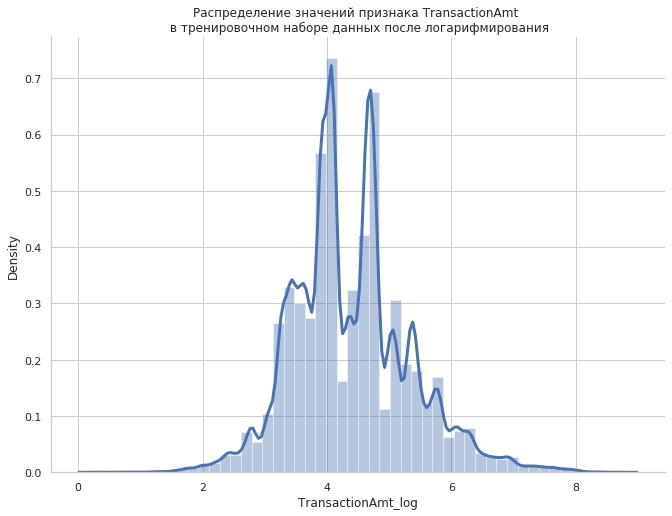

In [ ]:
plt.figure(figsize=(11, 8))
plt.title('Распределение значений признака TransactionAmt \n в тренировочном наборе данных после логарифмирования')
sns.distplot(df_train['TransactionAmt_log'])
sns.despine()
plt.show()

Не все суммы транзакций (в долларах) - целочисленные:

In [ ]:
df_train['TransactionAmt'].value_counts()[:15]

59.000000     20509
117.000000    19544
100.000000    16685
107.949997    15869
57.950001     15615
50.000000     14270
49.000000     10725
226.000000     7966
39.000000      7490
29.000000      7177
150.000000     6700
47.950001      6448
25.000000      6166
35.950001      5888
171.000000     5245
34.000000      5209
200.000000     5183
30.950001      5082
77.000000      4974
25.950001      4905
75.000000      4109
209.949997     4099
335.000000     3900
67.949997      3533
159.949997     3176
97.000000      3163
92.000000      2887
30.000000      2842
250.000000     2781
58.950001      2455
40.000000      2412
108.500000     2316
108.949997     2288
15.000000      2200
Name: TransactionAmt, dtype: int64

Добавим новый признак с количеством центов:

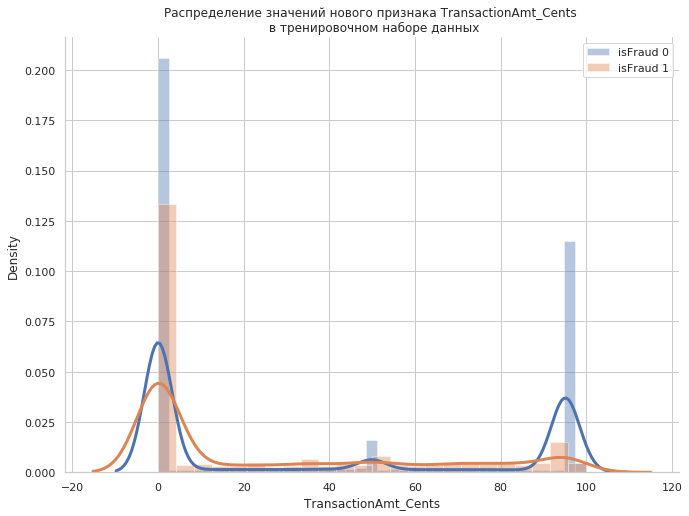

In [ ]:
df_train['TransactionAmt_Cents'] = np.modf(df_train['TransactionAmt'])[0] * 100
df_test['TransactionAmt_Cents'] = np.modf(df_test['TransactionAmt'])[0] * 100
plt.figure(figsize=(11, 8))
plt.title('Распределение значений нового признака TransactionAmt_Cents \n в тренировочном наборе данных')
sns.distplot(df_train[df_train['isFraud'] == 0]['TransactionAmt_Cents'], label='isFraud 0')
sns.distplot(df_train[df_train['isFraud'] == 1]['TransactionAmt_Cents'], label='isFraud 1')
plt.legend(loc='best')
sns.despine()
plt.show()

### **Признак ```ProductCD```**

In [ ]:
df_train_productCD = df_train.groupby('isFraud')['ProductCD'].value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('ProductCD')
df_test_productCD = df_test['ProductCD'].value_counts(normalize=True).rename('percentage').mul(100).reset_index()
df_test_productCD = df_test_productCD.rename({'index':'ProductCD'}, axis='columns')

No handles with labels found to put in legend.


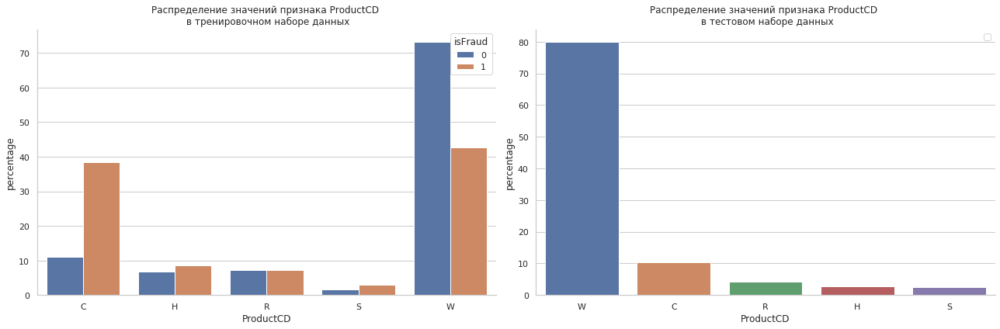

In [ ]:
plt.figure(figsize=(18,6))
plt.subplot(1,2,1)
sns.barplot(df_train_productCD['ProductCD'], df_train_productCD['percentage'], hue=df_train_productCD['isFraud'], data=df_train_productCD)
plt.title('Распределение значений признака ProductCD \n в тренировочном наборе данных')
plt.subplot(1,2,2)
sns.barplot(df_test_productCD['ProductCD'], df_test_productCD['percentage'], data=df_test_productCD)
plt.title('Распределение значений признака ProductCD \n в тестовом наборе данных')
plt.legend()
plt.tight_layout()
sns.despine()
plt.show()

Для типа C большая часть транзакций фишинг.

### **Признак ```card4```**

In [ ]:
df_train_card4 = df_train.groupby('isFraud')['card4'].value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('card4')
df_test_card4 = df_test['card4'].value_counts(normalize=True).rename('percentage').mul(100).reset_index()
df_test_card4 = df_test_card4.rename({'index':'card4'}, axis='columns')

No handles with labels found to put in legend.


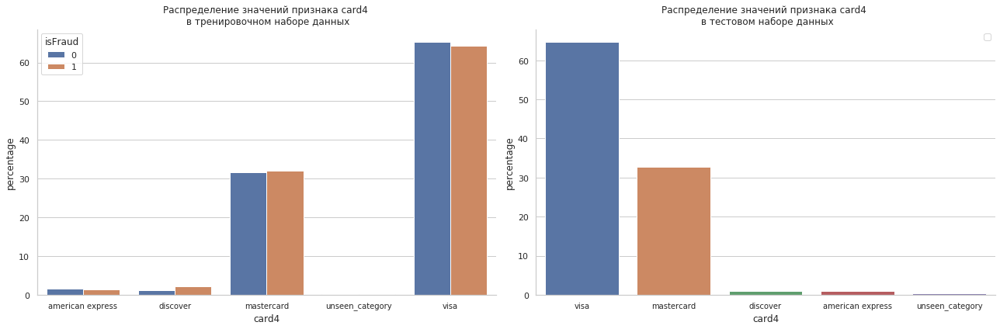

In [ ]:
plt.figure(figsize=(18,6))
plt.subplot(1,2,1)
plt.xticks(fontsize = 10)
sns.barplot(df_train_card4['card4'], df_train_card4['percentage'], hue=df_train_card4['isFraud'], data=df_train_card4)
plt.title('Распределение значений признака card4 \n в тренировочном наборе данных')
plt.subplot(1,2,2)
plt.xticks(fontsize = 10)
sns.barplot(df_test_card4['card4'], df_test_card4['percentage'], data=df_test_card4)
plt.title('Распределение значений признака card4 \n в тестовом наборе данных')
plt.legend()
plt.tight_layout()
sns.despine()
plt.show()

Большинство транзакций выполнено картами mastercard и visa.

### **Признак ```card6```**

In [ ]:
df_train_card6 = df_train.groupby('isFraud')['card6'].value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('card6')
df_test_card6 = df_test['card6'].value_counts(normalize=True).rename('percentage').mul(100).reset_index()
df_test_card6 = df_test_card6.rename({'index':'card6'}, axis='columns')

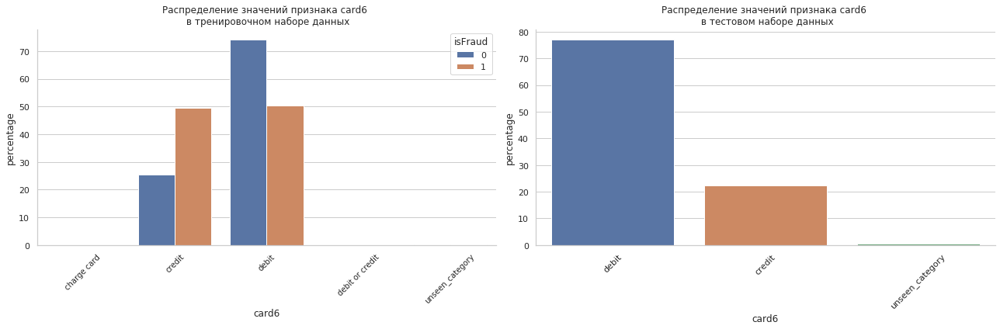

In [ ]:
plt.figure(figsize=(18,6))
plt.subplot(1,2,1)
sns.barplot(df_train_card6['card6'], df_train_card6['percentage'], hue=df_train_card6['isFraud'], data=df_train_card6)
plt.title('Распределение значений признака card6 \n в тренировочном наборе данных')
plt.xticks(rotation = 45, fontsize=10)
plt.subplot(1,2,2)
sns.barplot(df_test_card6['card6'], df_test_card6['percentage'], data=df_test_card6)
plt.title('Распределение значений признака card6 \n в тестовом наборе данных')
plt.xticks(rotation = 45)
plt.tight_layout()
sns.despine()
plt.show()

In [ ]:
df_train['card6'].value_counts()

debit              306554
credit             110132
unseen_category       826
debit or credit        30
charge card            15
Name: card6, dtype: int64

In [ ]:
df_train_card6[df_train_card6['card6'] == 'charge card']

,isFraud,card6,percentage
4,0,charge card,0.003724


In [ ]:
df_train_card6[df_train_card6['card6'] == 'debit or credit']

,isFraud,card6,percentage
3,0,debit or credit,0.007447


Так как в тренировочной выборке наблюдений для 'charge card' и 'debit or credit' очень мало, а в тестовой выборке есть только 'debit' и 'credit', объединим в тестовой выборке категории 'charge card' и 'debit or credit' в 'debit'.

In [ ]:
def replace_to_debit(row):
    if row ==  'charge card' or row == 'debit or credit':
        return 'debit'
    else:
        return row

df_train['card6'] = df_train['card6'].apply(replace_to_debit)    

In [ ]:
df_train_card6 = df_train.groupby('isFraud')['card6'].value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('card6')
df_test_card6 = df_test['card6'].value_counts(normalize=True).rename('percentage').mul(100).reset_index()
df_test_card6 = df_test_card6.rename({'index':'card6'}, axis='columns')

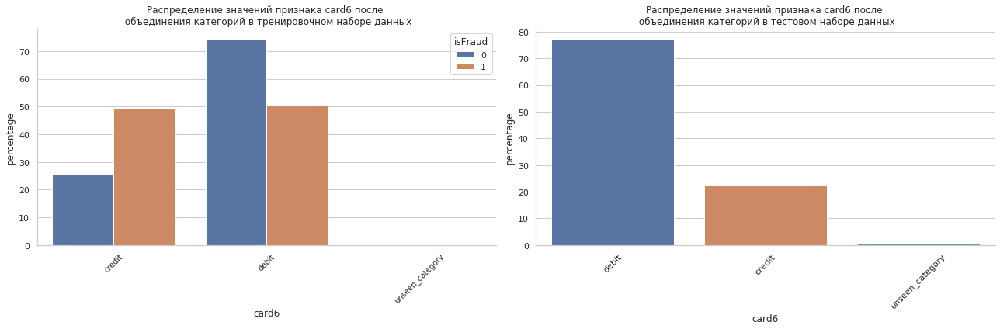

In [ ]:
plt.figure(figsize=(18,6))
plt.subplot(1,2,1)
sns.barplot(df_train_card6['card6'], df_train_card6['percentage'], hue=df_train_card6['isFraud'], data=df_train_card6)
plt.title('Распределение значений признака card6 после \n объединения категорий в тренировочном наборе данных')
plt.xticks(rotation = 45, fontsize=10)
plt.subplot(1,2,2)
sns.barplot(df_test_card6['card6'], df_test_card6['percentage'], data=df_test_card6)
plt.title('Распределение значений признака card6 после \n объединения категорий в тестовом наборе данных')
plt.xticks(rotation = 45)
plt.tight_layout()
sns.despine()
plt.show()

### **Признаки ```P_emaildomain``` и ```R_emaildomain```**

Добавим в данные признак, отвечающий за то, совпадают ли домены покупателя и получателя.

In [ ]:
df_train['same_emaildomain'] = (df_train['P_emaildomain'] == df_train['R_emaildomain']).astype('uint8')
df_test['same_emaildomain'] = (df_test['P_emaildomain'] == df_test['R_emaildomain']).astype('uint8')
df_train[['P_emaildomain', 'R_emaildomain', 'same_emaildomain']].tail()

,P_emaildomain,R_emaildomain,same_emaildomain
417554,gmail.com,unseen_category,0
417555,gmail.com,unseen_category,0
417556,hotmail.com,hotmail.com,1
417557,gmail.com,unseen_category,0
417558,gmail.com,unseen_category,0


In [ ]:
df_train_P_emaildomain = df_train.groupby('isFraud')['P_emaildomain'].value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('P_emaildomain')
df_test_P_emaildomain = df_test['P_emaildomain'].value_counts(normalize=True).rename('percentage').mul(100).reset_index()
df_test_P_emaildomain = df_test_P_emaildomain.rename({'index':'P_emaildomain'}, axis='columns')

df_train_R_emaildomain = df_train.groupby('isFraud')['R_emaildomain'].value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('R_emaildomain')
df_test_R_emaildomain = df_test['R_emaildomain'].value_counts(normalize=True).rename('percentage').mul(100).reset_index()
df_test_R_emaildomain = df_test_R_emaildomain.rename({'index':'R_emaildomain'}, axis='columns')

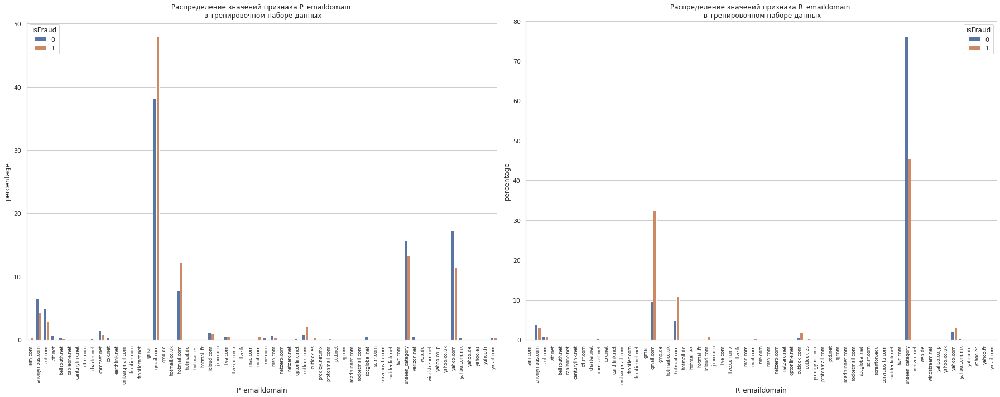

In [ ]:
plt.figure(figsize=(25,10))
plt.subplot(1,2,1)
sns.barplot(df_train_P_emaildomain['P_emaildomain'], df_train_P_emaildomain['percentage'], hue=df_train_P_emaildomain['isFraud'], data=df_train_P_emaildomain)
plt.title('Распределение значений признака P_emaildomain \n в тренировочном наборе данных')
plt.xticks(rotation = 90, fontsize=8)
plt.subplot(1,2,2)
sns.barplot(df_train_R_emaildomain['R_emaildomain'], df_train_R_emaildomain['percentage'], hue=df_train_R_emaildomain['isFraud'], data=df_train_R_emaildomain)
plt.title('Распределение значений признака R_emaildomain \n в тренировочном наборе данных')
plt.xticks(rotation = 90, fontsize=8)
plt.tight_layout()
sns.despine()
plt.show()

No handles with labels found to put in legend.
No handles with labels found to put in legend.


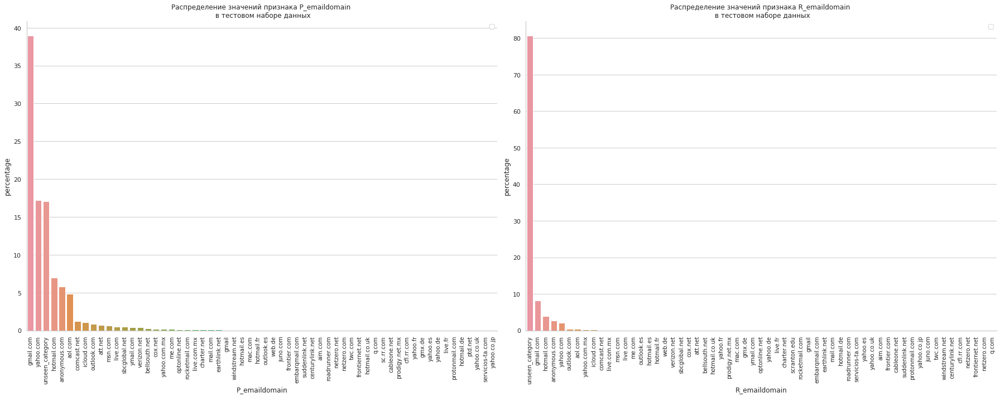

In [ ]:
plt.figure(figsize=(25,10))
plt.subplot(1,2,1)
sns.barplot(df_test_P_emaildomain['P_emaildomain'], df_test_P_emaildomain['percentage'], data=df_test_P_emaildomain)
plt.title('Распределение значений признака P_emaildomain \n в тестовом наборе данных')
plt.legend()
plt.xticks(rotation = 90, fontsize=10)
plt.subplot(1,2,2)
sns.barplot(df_test_R_emaildomain['R_emaildomain'], df_test_R_emaildomain['percentage'], data=df_test_R_emaildomain)
plt.xticks(rotation = 90, fontsize=10)
plt.title('Распределение значений признака R_emaildomain \n в тестовом наборе данных')
plt.legend()
plt.tight_layout()
sns.despine()
plt.show()

Объединим значения доменов.

In [ ]:
# Reference: https://www.kaggle.com/kabure/extensive-eda-and-modeling-xgb-hyperopt/notebook#Ploting-Transaction-Amount-Values-Distribution
df_train.loc[df_train['P_emaildomain'].isin(['gmail.com', 'gmail']),'P_emaildomain'] = 'Google'
df_train.loc[df_train['P_emaildomain'].isin(['yahoo.com', 'yahoo.com.mx',  'yahoo.co.uk',
                                         'yahoo.co.jp', 'yahoo.de', 'yahoo.fr',
                                         'yahoo.es']), 'P_emaildomain'] = 'Yahoo'
df_train.loc[df_train['P_emaildomain'].isin(['hotmail.com','outlook.com','msn.com', 'live.com.mx', 
                                         'hotmail.es','hotmail.co.uk', 'hotmail.de',
                                         'outlook.es', 'live.com', 'live.fr',
                                         'hotmail.fr']), 'P_emaildomain'] = 'Microsoft'
df_train.loc[df_train.P_emaildomain.isin(df_train.P_emaildomain.value_counts()[df_train.P_emaildomain.value_counts() <= 500 ].index), 'P_emaildomain'] = "Others"

df_train.loc[df_train['R_emaildomain'].isin(['gmail.com', 'gmail']),'R_emaildomain'] = 'Google'

df_train.loc[df_train['R_emaildomain'].isin(['yahoo.com', 'yahoo.com.mx',  'yahoo.co.uk',
                                             'yahoo.co.jp', 'yahoo.de', 'yahoo.fr',
                                             'yahoo.es']), 'R_emaildomain'] = 'Yahoo'
df_train.loc[df_train['R_emaildomain'].isin(['hotmail.com','outlook.com','msn.com', 'live.com.mx', 
                                             'hotmail.es','hotmail.co.uk', 'hotmail.de',
                                             'outlook.es', 'live.com', 'live.fr',
                                             'hotmail.fr']), 'R_emaildomain'] = 'Microsoft'
df_train.loc[df_train.R_emaildomain.isin(df_train.R_emaildomain.value_counts()[df_train.R_emaildomain.value_counts() <= 300 ].index), 'R_emaildomain'] = "Others"

In [ ]:
df_test.loc[df_test['P_emaildomain'].isin(['gmail.com', 'gmail']),'P_emaildomain'] = 'Google'
df_test.loc[df_test['P_emaildomain'].isin(['yahoo.com', 'yahoo.com.mx',  'yahoo.co.uk',
                                         'yahoo.co.jp', 'yahoo.de', 'yahoo.fr',
                                         'yahoo.es']), 'P_emaildomain'] = 'Yahoo'
df_test.loc[df_test['P_emaildomain'].isin(['hotmail.com','outlook.com','msn.com', 'live.com.mx', 
                                         'hotmail.es','hotmail.co.uk', 'hotmail.de',
                                         'outlook.es', 'live.com', 'live.fr',
                                         'hotmail.fr']), 'P_emaildomain'] = 'Microsoft'
df_test.loc[df_test.P_emaildomain.isin(df_test.P_emaildomain.value_counts()[df_test.P_emaildomain.value_counts() <= 500 ].index), 'P_emaildomain'] = "Others"

df_test.loc[df_test['R_emaildomain'].isin(['gmail.com', 'gmail']),'R_emaildomain'] = 'Google'

df_test.loc[df_test['R_emaildomain'].isin(['yahoo.com', 'yahoo.com.mx',  'yahoo.co.uk',
                                             'yahoo.co.jp', 'yahoo.de', 'yahoo.fr',
                                             'yahoo.es']), 'R_emaildomain'] = 'Yahoo'
df_test.loc[df_test['R_emaildomain'].isin(['hotmail.com','outlook.com','msn.com', 'live.com.mx', 
                                             'hotmail.es','hotmail.co.uk', 'hotmail.de',
                                             'outlook.es', 'live.com', 'live.fr',
                                             'hotmail.fr']), 'R_emaildomain'] = 'Microsoft'
df_test.loc[df_test.R_emaildomain.isin(df_test.R_emaildomain.value_counts()[df_test.R_emaildomain.value_counts() <= 300 ].index), 'R_emaildomain'] = "Others"

In [ ]:
df_train_P_emaildomain = df_train.groupby('isFraud')['P_emaildomain'].value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('P_emaildomain')
df_test_P_emaildomain = df_test['P_emaildomain'].value_counts(normalize=True).rename('percentage').mul(100).reset_index()
df_test_P_emaildomain = df_test_P_emaildomain.rename({'index':'P_emaildomain'}, axis='columns')

df_train_R_emaildomain = df_train.groupby('isFraud')['R_emaildomain'].value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('R_emaildomain')
df_test_R_emaildomain = df_test['R_emaildomain'].value_counts(normalize=True).rename('percentage').mul(100).reset_index()
df_test_R_emaildomain = df_test_R_emaildomain.rename({'index':'R_emaildomain'}, axis='columns')

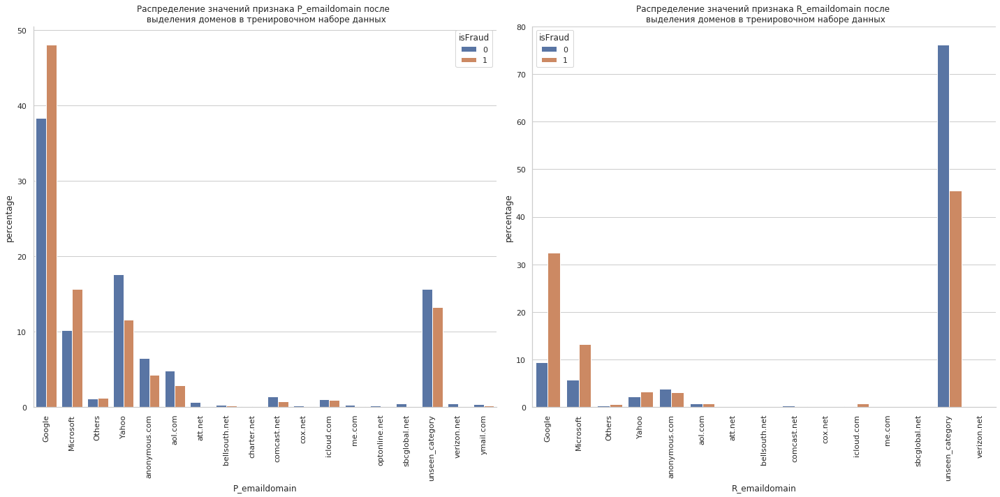

In [ ]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
sns.barplot(df_train_P_emaildomain['P_emaildomain'], df_train_P_emaildomain['percentage'], hue=df_train_P_emaildomain['isFraud'], data=df_train_P_emaildomain)
plt.title('Распределение значений признака P_emaildomain после \n выделения доменов в тренировочном наборе данных')
plt.xticks(rotation = 90)
plt.subplot(1,2,2)
sns.barplot(df_train_R_emaildomain['R_emaildomain'], df_train_R_emaildomain['percentage'], hue=df_train_R_emaildomain['isFraud'], data=df_train_R_emaildomain)
plt.title('Распределение значений признака R_emaildomain после \n выделения доменов в тренировочном наборе данных')
plt.xticks(rotation = 90)
plt.tight_layout()
sns.despine()
plt.show()

No handles with labels found to put in legend.
No handles with labels found to put in legend.


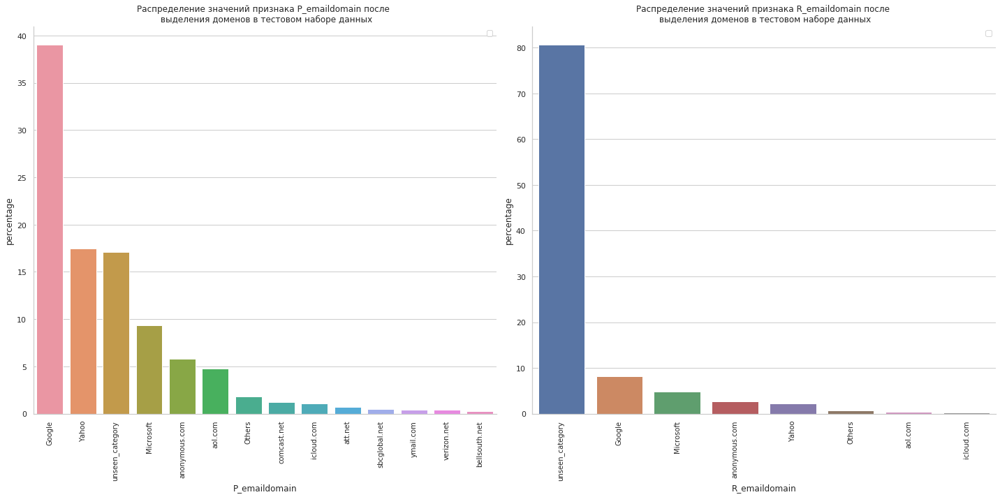

In [ ]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
sns.barplot(df_test_P_emaildomain['P_emaildomain'], df_test_P_emaildomain['percentage'], data=df_test_P_emaildomain)
plt.title('Распределение значений признака P_emaildomain после \n выделения доменов в тестовом наборе данных')
plt.legend()
plt.xticks(rotation = 90, fontsize=10)
plt.subplot(1,2,2)
sns.barplot(df_test_R_emaildomain['R_emaildomain'], df_test_R_emaildomain['percentage'], data=df_test_R_emaildomain)
plt.xticks(rotation = 90, fontsize=10)
plt.title('Распределение значений признака R_emaildomain после \n выделения доменов в тестовом наборе данных')
plt.legend()
plt.tight_layout()
sns.despine()
plt.show()

Удалим признаки ```P_emaildomain``` и ```R_emaildomain```

In [ ]:
df_train.drop(columns=['P_emaildomain', 'R_emaildomain'], inplace=True)
df_test.drop(columns=['P_emaildomain', 'R_emaildomain'], inplace=True)

### **Признаки ```DeviceType``` и ```DeviceInfo```**

In [ ]:
df_train_DeviceType = df_train.groupby('isFraud')['DeviceType'].value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('DeviceType')
df_test_DeviceType = df_test['DeviceType'].value_counts(normalize=True).rename('percentage').mul(100).reset_index()
df_test_DeviceType = df_test_DeviceType.rename({'index':'DeviceType'}, axis='columns')

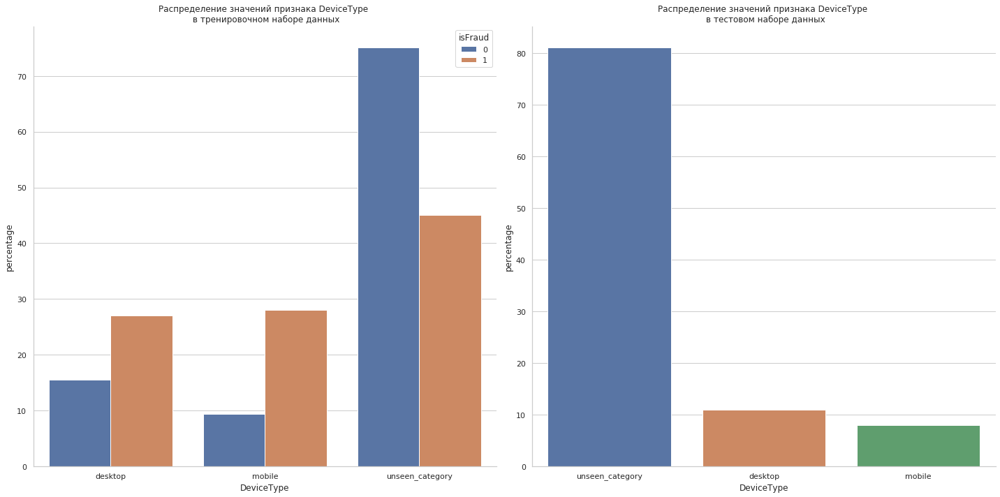

In [ ]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
sns.barplot(df_train_DeviceType['DeviceType'], df_train_DeviceType['percentage'], hue=df_train_DeviceType['isFraud'], data=df_train_DeviceType)
plt.title('Распределение значений признака DeviceType \n в тренировочном наборе данных')
#plt.xticks(rotation = 90, fontsize=8)
plt.subplot(1,2,2)
sns.barplot(df_test_DeviceType['DeviceType'], df_test_DeviceType['percentage'], data=df_test_DeviceType)
plt.title('Распределение значений признака DeviceType \n в тестовом наборе данных')
#plt.xticks(rotation = 90, fontsize=8)
plt.tight_layout()
sns.despine()
plt.show()

In [ ]:
df_train_DeviceInfo = df_train.groupby('isFraud')['DeviceInfo'].value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('DeviceInfo')
df_test_DeviceInfo = df_test['DeviceInfo'].value_counts(normalize=True).rename('percentage').mul(100).reset_index()
df_test_DeviceInfo = df_test_DeviceInfo.rename({'index':'DeviceInfo'}, axis='columns')

In [ ]:
df_test_DeviceInfo.value_counts()

DeviceInfo             percentage
vivo                   0.002890      1
LG-K212                0.000578      1
LG-TP260 Build/NRD90U  0.000578      1
LG-SP320               0.000578      1
LG-P714                0.000578      1
                                    ..
SM-A520F Build/MMB29K  0.001156      1
SM-A510M Build/NRD90M  0.004047      1
SM-A510M Build/MMB29K  0.001734      1
SM-A510M Build/LMY47X  0.000578      1
2PYB2                  0.000578      1
Length: 1034, dtype: int64

Добавим новый признак DeviceCorp, объединив данные из DeviceInfo.

In [ ]:
# Reference: https://www.kaggle.com/jolly2136/eda-fe-xgb
def transform_DeviceInfo(df):
    df['DeviceCorp'] = df['DeviceInfo']
    df.loc[df['DeviceInfo'].str.contains('HUAWEI|HONOR', case=False, na=False, regex=True), 'DeviceCorp'] = 'HUAWEI'
    df.loc[df['DeviceInfo'].str.contains('OS', na=False, regex=False), 'DeviceCorp'] = 'APPLE'
    df.loc[df['DeviceInfo'].str.contains('Idea|TA', case=False, na=False), 'DeviceCorp'] = 'Lenovo'
    df.loc[df['DeviceInfo'].str.contains('Moto|XT|Edison', case=False, na=False), 'DeviceCorp'] = 'Moto'
    df.loc[df['DeviceInfo'].str.contains('MI|Mi|Redmi', na=False), 'DeviceCorp'] = 'Mi'
    df.loc[df['DeviceInfo'].str.contains('VS|LG|EGO', na=False), 'DeviceCorp'] = 'LG'
    df.loc[df['DeviceInfo'].str.contains('ONE TOUCH|ALCATEL', case=False, na=False, regex=False), 'DeviceCorp'] = 'ALCATEL'
    df.loc[df['DeviceInfo'].str.contains('ONE A', na=False, regex=False), 'DeviceCorp'] = 'ONEPLUS'
    df.loc[df['DeviceInfo'].str.contains('OPR6', na=False, regex=False), 'DeviceCorp'] = 'HTC'
    df.loc[df['DeviceInfo'].str.contains('Nexus|Pixel', case=False, na=False, regex=True), 'DeviceCorp'] = 'google'
    df.loc[df['DeviceInfo'].str.contains('STV', na=False, regex=False), 'DeviceCorp'] = 'blackberry'
    df.loc[df['DeviceInfo'].str.contains('ASUS', case=False, na=False, regex=False), 'DeviceCorp'] = 'ASUS'
    df.loc[df['DeviceInfo'].str.contains('BLADE', case=False, na=False, regex=False), 'DeviceCorp'] = 'ZTE'
    
    df['DeviceCorp'] = df['DeviceInfo'].astype('str').str.split(':', expand=True)[0].\
                                str.split('-', expand=True)[0].str.split(expand=True)[0]
    
    df.loc[df['DeviceInfo'].isin(['rv', 'SM', 'GT', 'SGH']), 'DeviceCorp'] = 'SAMSUNG'
    df.loc[df['DeviceInfo'].str.startswith('Z', na=False), 'DeviceCorp'] = 'ZTE'
    df.loc[df['DeviceInfo'].str.startswith('KF', na=False), 'DeviceCorp'] = 'Amazon'
    
    for i in ['D', 'E', 'F', 'G']:
        df.loc[df['DeviceInfo'].str.startswith(i, na=False), 'DeviceCorp'] = 'SONY'

    df.loc[df['DeviceCorp'].isin(df['DeviceCorp'].value_counts()\
                                 [df['DeviceCorp'].value_counts() < 100].index), 'DeviceCorp'] = 'Other'
    df['DeviceCorp'] = df['DeviceCorp'].str.upper()
    
    return df

In [ ]:
df_train = transform_DeviceInfo(df_train)
df_test = transform_DeviceInfo(df_test)

In [ ]:
df_train_DeviceCorp = df_train.groupby('isFraud')['DeviceCorp'].value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('DeviceCorp')
df_test_DeviceCorp = df_test['DeviceCorp'].value_counts(normalize=True).rename('percentage').mul(100).reset_index()
df_test_DeviceCorp = df_test_DeviceCorp.rename({'index':'DeviceCorp'}, axis='columns')

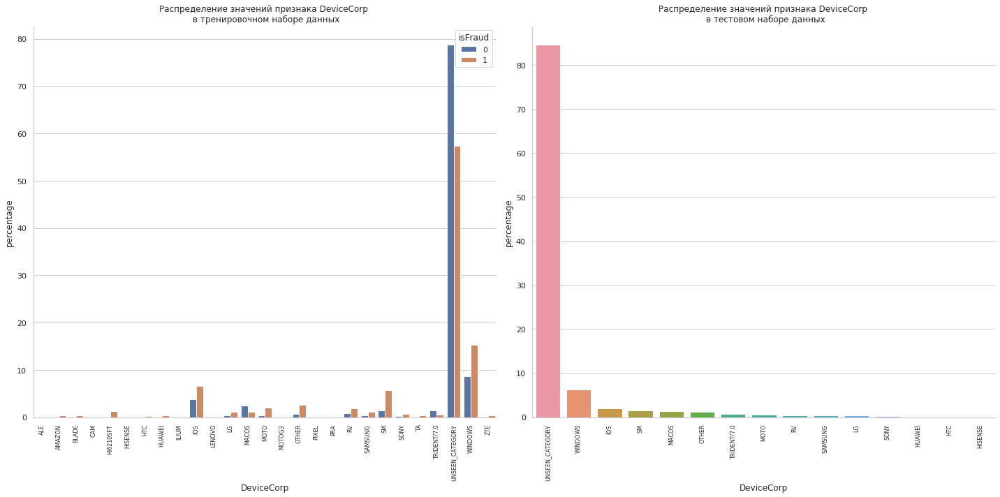

In [ ]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
sns.barplot(df_train_DeviceCorp['DeviceCorp'], df_train_DeviceCorp['percentage'], hue=df_train_DeviceCorp['isFraud'], data=df_train_DeviceCorp)
plt.title('Распределение значений признака DeviceCorp \n в тренировочном наборе данных')
plt.xticks(rotation = 90, fontsize=8)
plt.subplot(1,2,2)
sns.barplot(df_test_DeviceCorp['DeviceCorp'], df_test_DeviceCorp['percentage'], data=df_test_DeviceCorp)
plt.title('Распределение значений признака DeviceCorp \n в тестовом наборе данных')
plt.xticks(rotation = 90, fontsize=8)
plt.tight_layout()
sns.despine()
plt.show()

In [ ]:
df_train

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,id_38,DeviceType,DeviceInfo,day,hour,froud_probability,TransactionAmt_log,TransactionAmt_Cents,same_emaildomain,DeviceCorp
0,2987000,0,86400,68.500000,W,13926,99,150,discover,142,...,unseen_category,unseen_category,unseen_category,2.0,0.0,hight,4.241327,50.000000,1,UNSEEN_CATEGORY
1,2987001,0,86401,29.000000,W,2755,404,150,mastercard,102,...,unseen_category,unseen_category,unseen_category,3.0,1.0,hight,3.401197,0.000000,0,UNSEEN_CATEGORY
2,2987002,0,86469,59.000000,W,4663,490,150,visa,166,...,unseen_category,unseen_category,unseen_category,3.0,1.0,hight,4.094345,0.000000,0,UNSEEN_CATEGORY
3,2987003,0,86499,50.000000,W,18132,567,150,mastercard,117,...,unseen_category,unseen_category,unseen_category,3.0,1.0,hight,3.931826,0.000000,0,UNSEEN_CATEGORY
4,2987004,0,86506,50.000000,H,4497,514,150,mastercard,102,...,T,mobile,SAMSUNG SM-G892A Build/NRD90M,3.0,1.0,hight,3.931826,0.000000,0,SAMSUNG
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
417554,3404554,0,10540759,335.000000,W,2538,476,150,visa,166,...,unseen_category,unseen_category,unseen_category,4.0,0.0,hight,5.817111,0.000000,0,UNSEEN_CATEGORY
417555,3404555,0,10540766,160.500000,W,6019,583,150,visa,226,...,unseen_category,unseen_category,unseen_category,4.0,0.0,hight,5.084505,50.000000,0,UNSEEN_CATEGORY
417556,3404556,0,10540775,230.078995,C,5059,138,200,visa,226,...,F,mobile,SM-A320FL Build/NRD90M,4.0,0.0,hight,5.442760,7.899475,1,SM
417557,3404557,0,10540789,105.000000,W,6697,111,150,visa,195,...,unseen_category,unseen_category,unseen_category,4.0,0.0,hight,4.663439,0.000000,0,UNSEEN_CATEGORY


### **Признаки ```С1-С14```**

In [ ]:
#len(df_train.loc[df_train['isFraud']==0]['TransactionDT'])
df_train.loc[df_train['isFraud']==0][col]

0                       unseen_category
1                       unseen_category
2                       unseen_category
3                       unseen_category
4         SAMSUNG SM-G892A Build/NRD90M
                      ...              
417554                  unseen_category
417555                  unseen_category
417556           SM-A320FL Build/NRD90M
417557                  unseen_category
417558                  unseen_category
Name: DeviceInfo, Length: 402836, dtype: object

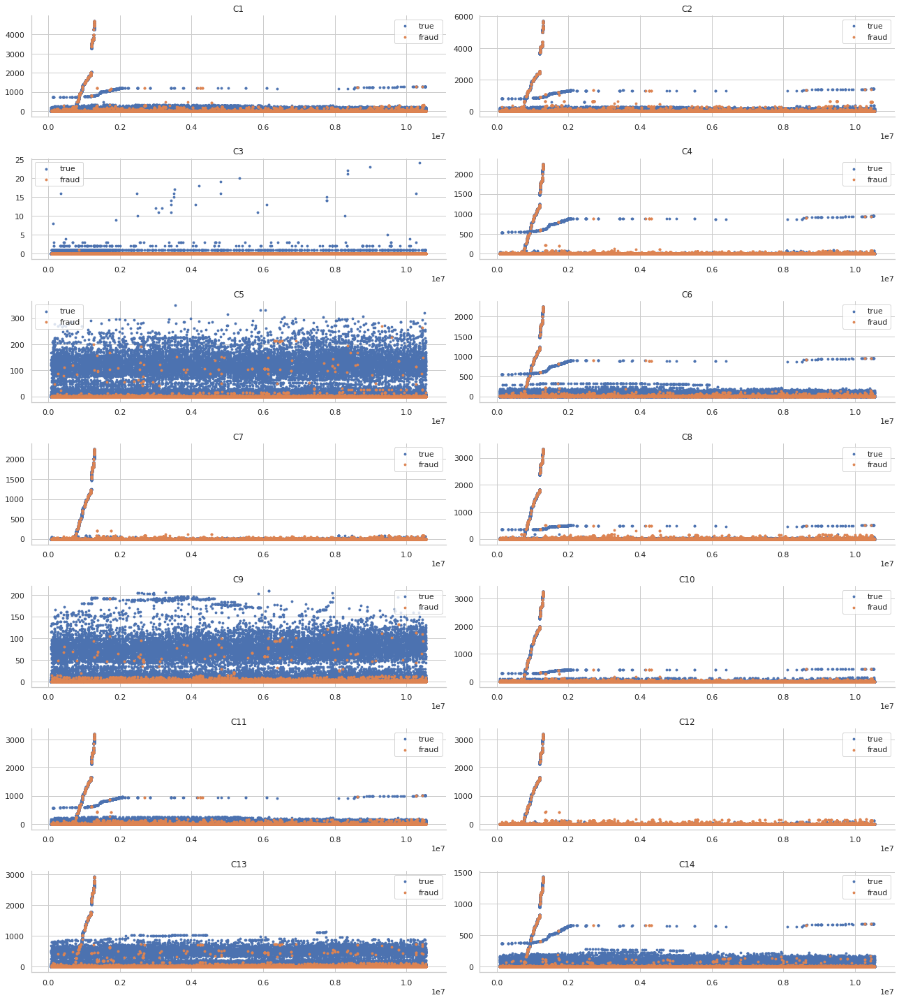

In [ ]:
c_features = [col for col in df_train.columns if col.startswith('C')]
fig, axes = plt.subplots(nrows=7, ncols=2, figsize=(18, 20))
for i in range(len(c_features)):
    col = c_features[i]
    j1 = i // 2
    j2 = i % 2
    ax = axes[j1, j2]
    ax.set_title(col)
    ax.scatter(df_train.loc[df_train['isFraud']==0]['TransactionDT'], df_train.loc[df_train['isFraud']==0][col], s=8, label='true')
    ax.scatter(df_train.loc[df_train['isFraud']==1]['TransactionDT'], df_train.loc[df_train['isFraud']==1][col], s=8, label='fraud')
    ax.legend(loc='best')
plt.tight_layout()
sns.despine()
plt.show()

### **Признаки ```D1-D15```**

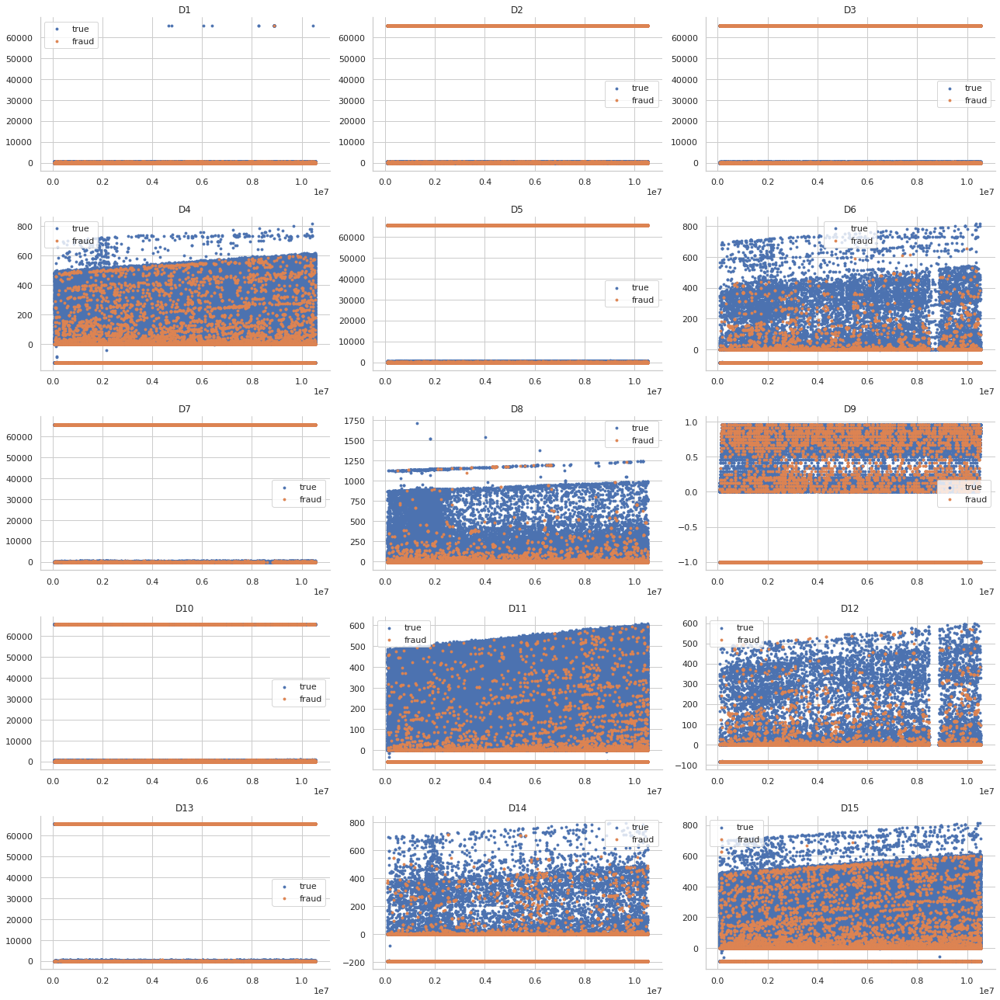

In [ ]:
d_features = [col for col in df_train.columns if col.startswith('D')][:-3]
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(18, 18))
for i in range(len(d_features)):
    col = d_features[i]
    j1 = i // 3
    j2 = i % 3
    ax = axes[j1, j2]
    ax.set_title(col)
    ax.scatter(df_train.loc[df_train['isFraud']==0]['TransactionDT'], df_train.loc[df_train['isFraud']==0][col], s=8, label='true')
    ax.scatter(df_train.loc[df_train['isFraud']==1]['TransactionDT'], df_train.loc[df_train['isFraud']==1][col], s=8, label='fraud')
    ax.legend(loc='best')
plt.tight_layout()
sns.despine()
plt.show()

### **Создание дополнительных признаков (Additional Feature Engineering)**

In [ ]:
# Reference: https://www.kaggle.com/kabure/extensive-eda-and-modeling-xgb-hyperopt/notebook#Some-feature-engineering
df_train['Trans_min_mean'] = df_train['TransactionAmt'] - df_train['TransactionAmt'].mean()
df_train['Trans_min_std'] = df_train['Trans_min_mean'] / df_train['TransactionAmt'].std()
df_test['Trans_min_mean'] = df_test['TransactionAmt'] - df_test['TransactionAmt'].mean()
df_test['Trans_min_std'] = df_test['Trans_min_mean'] / df_test['TransactionAmt'].std()
df_train['TransactionAmt_to_mean_card1'] = df_train['TransactionAmt'] / \
    df_train.groupby(['card1'])['TransactionAmt'].transform('mean')
df_train['TransactionAmt_to_mean_card4'] = df_train['TransactionAmt'] / \
    df_train.groupby(['card4'])['TransactionAmt'].transform('mean')
df_train['TransactionAmt_to_std_card1'] = df_train['TransactionAmt'] / \
    df_train.groupby(['card1'])['TransactionAmt'].transform('std')
df_train['TransactionAmt_to_std_card4'] = df_train['TransactionAmt'] / \
    df_train.groupby(['card4'])['TransactionAmt'].transform('std')

df_test['TransactionAmt_to_mean_card1'] = df_test['TransactionAmt'] / \
    df_test.groupby(['card1'])['TransactionAmt'].transform('mean')
df_test['TransactionAmt_to_mean_card4'] = df_test['TransactionAmt'] / \
    df_test.groupby(['card4'])['TransactionAmt'].transform('mean')
df_test['TransactionAmt_to_std_card1'] = df_test['TransactionAmt'] / \
    df_test.groupby(['card1'])['TransactionAmt'].transform('std')
df_test['TransactionAmt_to_std_card4'] = df_test['TransactionAmt'] / \
    df_test.groupby(['card4'])['TransactionAmt'].transform('std')

In [ ]:
def create_feat(fr):
    return fr.astype(str).agg('-'.join, axis=1)

coinc_col = ['M' + str(i) for i in range(1,10)]
df_train['M1_M9'] = create_feat(df_train.loc[:, coinc_col])
df_test['M1_M9'] = create_feat(df_test.loc[:, coinc_col])

card_col = ['card' + str(i) for i in range(1,7)]
df_train['C1_C6'] = create_feat(df_train.loc[:, card_col[:-1]])
df_test['C1_C6'] = create_feat(df_test.loc[:, card_col[:-1]])

In [ ]:
df_train.drop(columns=coinc_col, inplace=True)
df_train.drop(columns=card_col, inplace=True)
df_test.drop(columns=coinc_col, inplace=True)
df_test.drop(columns=card_col, inplace=True)

**Для признака ```M1_M9```**

In [ ]:
df_train_M = df_train.groupby('isFraud')['M1_M9'].value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('M1_M9')
df_test_M = df_test['M1_M9'].value_counts(normalize=True).rename('percentage').mul(100).reset_index()
df_test_M = df_test_M.rename({'index':'M'}, axis='columns')

In [ ]:
df_train_M['ratio'] = df_train_M['percentage'].div(df_train_M['percentage'].sum())
df_test_M['ratio'] = df_test_M['percentage'].div(df_test_M['percentage'].sum())

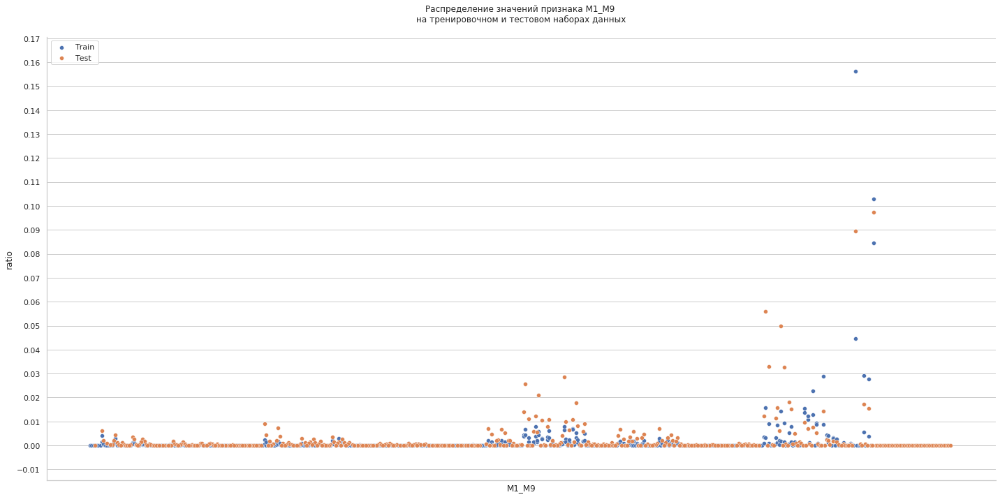

In [ ]:
#построим распределение транзакций по часам
plt.figure(figsize=(20,10))
plt.title('Распределение значений признака М1_М9 \n на тренировочном и тестовом наборах данных \n')
plt.xticks(fontsize = 8)
sct = sns.scatterplot(x=df_train_M['M1_M9'], y=df_train_M['ratio'], data=df_train_M)
sct = sns.scatterplot(x=df_test_M['M'], y=df_test_M['ratio'], data=df_test_M)
sct.xaxis.set_major_locator(plt.NullLocator())
sct.yaxis.set_major_locator(MultipleLocator(0.01))
plt.legend(['Train', 'Test'], loc='upper left')
plt.tight_layout()
sns.despine()
plt.show()

In [ ]:
hi_M = df_train_M[df_train_M.ratio >= 0.06]['M1_M9'].to_list()
mid_M = df_train_M[(df_train_M.ratio >= 0.02) & (df_train_M.ratio < 0.06)]['M1_M9'].to_list()
low_M = df_train_M[(df_train_M.ratio >= 0) & (df_train_M.ratio < 0.02)]['M1_M9'].to_list()

In [ ]:
df_train.loc[df_train['M1_M9'].isin(hi_M), 'M1_M9'] = 'hi'
df_train.loc[df_train['M1_M9'].isin(mid_M), 'M1_M9'] = 'mid'
df_train.loc[df_train['M1_M9'].isin(low_M), 'M1_M9'] = 'low'

In [ ]:
df_test.loc[df_test['M1_M9'].isin(hi_M), 'M1_M9'] = 'hi'
df_test.loc[df_test['M1_M9'].isin(mid_M), 'M1_M9'] = 'mid'
df_test.loc[df_test['M1_M9'].isin(low_M), 'M1_M9'] = 'low'

In [ ]:
df_train['M1_M9'].unique()

array(['low', 'mid', 'hi'], dtype=object)

**Для признака ```C1_C6```**

In [ ]:
df_train_C = df_train.groupby('isFraud')['C1_C6'].value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('C1_C6')
df_test_C = df_test['C1_C6'].value_counts(normalize=True).rename('percentage').mul(100).reset_index()
df_test_C = df_test_C.rename({'index':'C'}, axis='columns')

In [ ]:
df_train_C['ratio'] = df_train_C['percentage'].div(df_train_C['percentage'].sum())
df_test_C['ratio'] = df_test_C['percentage'].div(df_test_C['percentage'].sum())

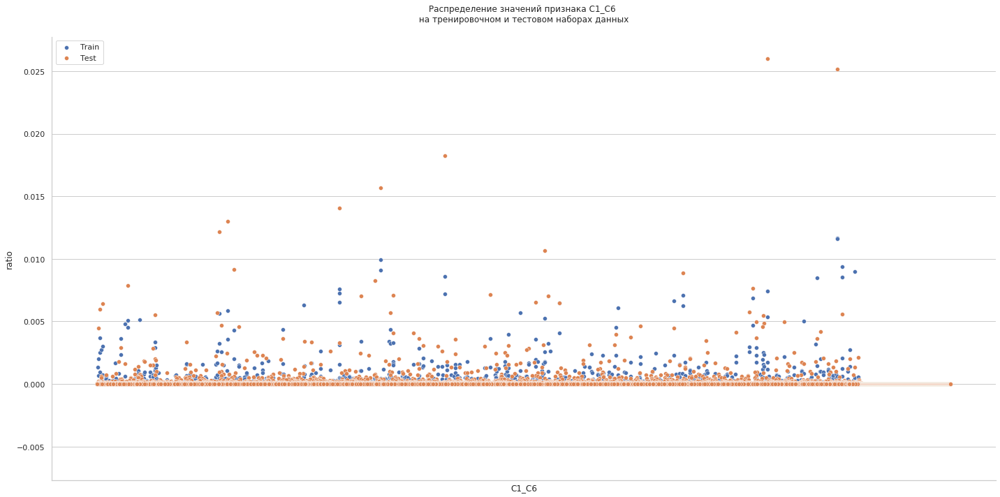

In [ ]:
#построим распределение транзакций по часам
plt.figure(figsize=(20,10))
plt.title('Распределение значений признака С1_С6 \n на тренировочном и тестовом наборах данных \n')
plt.xticks(fontsize = 8)
sct = sns.scatterplot(x=df_train_C['C1_C6'], y=df_train_C['ratio'], data=df_train_C)
sct = sns.scatterplot(x=df_test_C['C'], y=df_test_C['ratio'], data=df_test_C)
sct.xaxis.set_major_locator(plt.NullLocator())
plt.legend(['Train', 'Test'], loc='upper left')
plt.tight_layout()
sns.despine()
plt.show()

In [ ]:
hi_C = df_train_C[df_train_C.ratio >= 0.010]['C1_C6'].to_list()
mid_C = df_train_C[(df_train_C.ratio >= 0.001) & (df_train_C.ratio < 0.010)]['C1_C6'].to_list()
low_C = df_train_C[(df_train_C.ratio >= 0) & (df_train_C.ratio < 0.001)]['C1_C6'].to_list()

In [ ]:
df_train.loc[df_train['C1_C6'].isin(hi_C), 'C1_C6'] = 'hi'
df_train.loc[df_train['C1_C6'].isin(mid_C), 'C1_C6'] = 'mid'
df_train.loc[df_train['C1_C6'].isin(low_C), 'C1_C6'] = 'low'

In [ ]:
df_test.loc[df_test['C1_C6'].isin(hi_C), 'C1_C6'] = 'hi'
df_test.loc[df_test['C1_C6'].isin(mid_C), 'C1_C6'] = 'mid'
df_test.loc[df_test['C1_C6'].isin(low_C), 'C1_C6'] = 'low'

In [ ]:
df_train['C1_C6'].unique()

array(['low', 'mid', 'hi'], dtype=object)

### **Итоговый датасет**

In [ ]:
month_length = 3600 * 24 * 30

In [ ]:
#выделим фолды для валидации
fold0_idx = df_train[df_train['TransactionDT'] < df_train['TransactionDT'].min() + month_length].index
fold1_idx = df_train[(df_train['TransactionDT'].min() + month_length <= df_train['TransactionDT']) & (df_train['TransactionDT'] < df_train['TransactionDT'].min() + 2 * month_length)].index
fold2_idx = df_train[(df_train['TransactionDT'].min() + 2 * month_length <= df_train['TransactionDT']) & (df_train['TransactionDT'] < df_train['TransactionDT'].min() + 3 * month_length)].index
fold3_idx = df_train[df_train['TransactionDT'].min() + 3 * month_length <= df_train['TransactionDT']].index
print('Validation set 0 length:', len(fold0_idx))
print('Validation set 1 length:', len(fold1_idx))
print('Validation set 2 length:', len(fold2_idx))
print('Validation set 3 length:', len(fold3_idx))

Validation set 0 length: 134339
Validation set 1 length: 89399
Validation set 2 length: 92187
Validation set 3 length: 101632


In [ ]:
folds_idx = [fold0_idx, fold1_idx, fold2_idx, fold3_idx]

В данных есть признак-идентификатор объекта - `'TransactionID'`. Заметим, что его значения в обучающей и тестовых выборках не пересекаются:

In [ ]:
set(df_train['TransactionID']).intersection(set(df_test['TransactionID']))

set()

Также не пересекаются значения признака, отвечающего за момент времени - `'TransactionDT'`:

In [ ]:
set(df_train['TransactionDT']).intersection(set(df_test['TransactionDT']))

set()

В связи с этим удалим эти признаки, чтобы модель их не учитывала.

In [ ]:
df_train.drop(['TransactionID', 'TransactionDT'], axis=1, inplace=True)
df_test.drop(['TransactionID', 'TransactionDT'], axis=1, inplace=True)
df_train.shape, df_test.shape

((417557, 420), (172981, 419))

После всех операций с признаками удалим столбец 'TransactionAmt', раз он уже есть у нас в логарифмированном виде - чтобы модель на него не отвлекалась:


In [ ]:
df_train.drop('TransactionAmt', axis=1, inplace=True)
df_test.drop('TransactionAmt', axis=1, inplace=True)

In [ ]:
df_train['TransactionAmt_to_std_card1']= df_train['TransactionAmt_to_std_card1'].fillna(0)
df_train.isna().sum().sort_values(ascending=False)

C1_C6      0
V70        0
V98        0
V99        0
V100       0
          ..
V249       0
V250       0
V251       0
V252       0
isFraud    0
Length: 419, dtype: int64

In [ ]:
feature_num_list = set(df_train.select_dtypes(include=['float64', 'int64', 'float32', 'float64', 'int16', 'int8', 'uint16', 'uint32', 'uint8']).columns) -set(cat_features)
feature_num_list = feature_num_list - set(['day', 'hour' , 'same_emaildomain'])

Закодируем категориальные признаки с помощью [`LabelEncoder`](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.LabelEncoder.html) и сконвертируем их в [`category`](https://pandas.pydata.org/pandas-docs/version/0.23.4/categorical.html).

In [ ]:
for col in tqdm(df_train.columns.drop('isFraud')):
    if df_train[col].dtype == 'O':
        le = LabelEncoder()
        le.fit(list(df_train[col]) + list(df_test[col]))
        df_train[col] = le.transform(df_train[col])
        df_test[col] = le.transform(df_test[col])
        
        df_train[col] = df_train[col].astype('category')
        df_test[col] = df_test[col].astype('category')
#     if col in feature_num_list:
#         df_train[col] = preprocessing.normalize(df_train.loc[:,[col]], axis = 0)
#         df_test[col] = preprocessing.normalize(df_test.loc[:,[col]], axis = 0)

#df_train.info(), df_test.info()

100%|██████████| 418/418 [00:04<00:00, 92.77it/s] 


In [ ]:
df_train.info(), df_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 417557 entries, 0 to 417558
Columns: 419 entries, isFraud to C1_C6
dtypes: category(14), float32(85), float64(4), int16(7), int8(9), uint16(38), uint32(1), uint8(261)
memory usage: 302.3 MB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 172981 entries, 0 to 172980
Columns: 418 entries, ProductCD to C1_C6
dtypes: category(14), float32(83), float64(4), int16(6), int8(9), uint16(55), uint32(1), uint8(246)
memory usage: 127.0 MB


(None, None)

# **5. Корреляции признаков**

In [ ]:
corr_matrix_pearson = df_train.corr(method='pearson')

In [ ]:
# corr_matrix_spearman = df_train.corr(method='spearman')

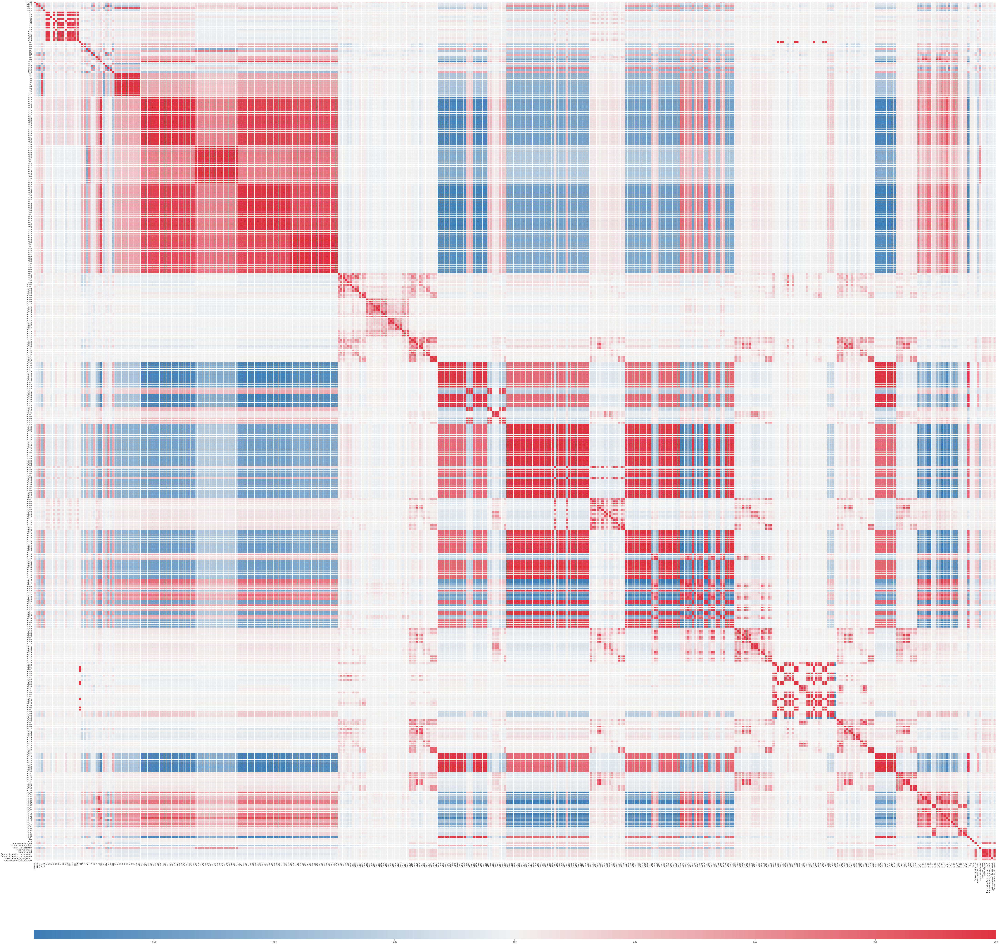

In [ ]:
plot_corr_matrix(corr_matrix_pearson,(100,100), annot=False)

In [ ]:
df_train_without_hicorr, droped_cols_train = remove_hicorr_features(
    df_train,
    corr_matrix_pearson,
    # corr_matrix_spearman,
    0.6, 'isFraud'
)

# **6. Моделирование**

### **Без удаления высоко коррелирующих признаков**

#### **Модель**

In [ ]:
%%time

params = {
    'objective': 'binary',
    'boosting_type': 'gbdt',
    'metric': 'auc',
    'n_jobs': -1,
    'n_estimators': 1000,
    'seed': 13,
    'early_stopping_rounds': 200,
}

scores = []

feature_importances = pd.DataFrame()
feature_importances['feature'] = df_train.columns.drop('isFraud')

test_preds = []

for i in range(len(folds_idx)):
    X_train = df_train.drop(folds_idx[i], axis=0)
    y_train = X_train['isFraud'].values
    X_val = df_train.loc[folds_idx[i]]
    y_val = X_val['isFraud'].values
    X_train = X_train.drop('isFraud', axis=1)
    X_val = X_val.drop('isFraud', axis=1)

    lgb_train = lgb.Dataset(X_train, y_train)
    lgb_eval = lgb.Dataset(X_val, y_val, reference=lgb_train)
    lgb_model = lgb.train(params, lgb_train, valid_sets=lgb_eval, verbose_eval=100)
    
    feature_importances['fold_{}'.format(i)] = lgb_model.feature_importance()

    y_pred = lgb_model.predict(X_val)
    score_fold = roc_auc_score(y_val, y_pred)
    scores.append(score_fold)
    y_test_pred = lgb_model.predict(df_test)
    test_preds.append(y_test_pred)

for i in range(len(scores)):
    print('Fold {}, AUC-ROC: {:.5f}'.format(i, scores[i]))
print('CV AUC-ROC: {:.5f}'.format(np.mean(scores)))

Training until validation scores don't improve for 200 rounds.
[100]	valid_0's auc: 0.880799
[200]	valid_0's auc: 0.887696
[300]	valid_0's auc: 0.890803
[400]	valid_0's auc: 0.892045
[500]	valid_0's auc: 0.892981
[600]	valid_0's auc: 0.892843
Early stopping, best iteration is:
[492]	valid_0's auc: 0.89317
Training until validation scores don't improve for 200 rounds.
[100]	valid_0's auc: 0.900671
[200]	valid_0's auc: 0.906669
[300]	valid_0's auc: 0.908496
[400]	valid_0's auc: 0.910076
[500]	valid_0's auc: 0.91038
[600]	valid_0's auc: 0.910101
Early stopping, best iteration is:
[469]	valid_0's auc: 0.910941
Training until validation scores don't improve for 200 rounds.
[100]	valid_0's auc: 0.910263
[200]	valid_0's auc: 0.915057
[300]	valid_0's auc: 0.917497
[400]	valid_0's auc: 0.919558
[500]	valid_0's auc: 0.918666
[600]	valid_0's auc: 0.918524
Early stopping, best iteration is:
[415]	valid_0's auc: 0.919799
Training until validation scores don't improve for 200 rounds.
[100]	valid_0's

In [ ]:
fold_cols = [col for col in feature_importances.columns if col.startswith('fold_')]
feature_importances['average'] = feature_importances[fold_cols].mean(axis=1)
feature_importances.head()

,feature,fold_0,fold_1,fold_2,fold_3,average
0,ProductCD,56,64,60,52,58.00
1,addr1,686,685,595,249,553.75
2,addr2,2,7,9,1,4.75
3,dist1,258,238,158,82,184.00
4,dist2,123,93,73,23,78.00


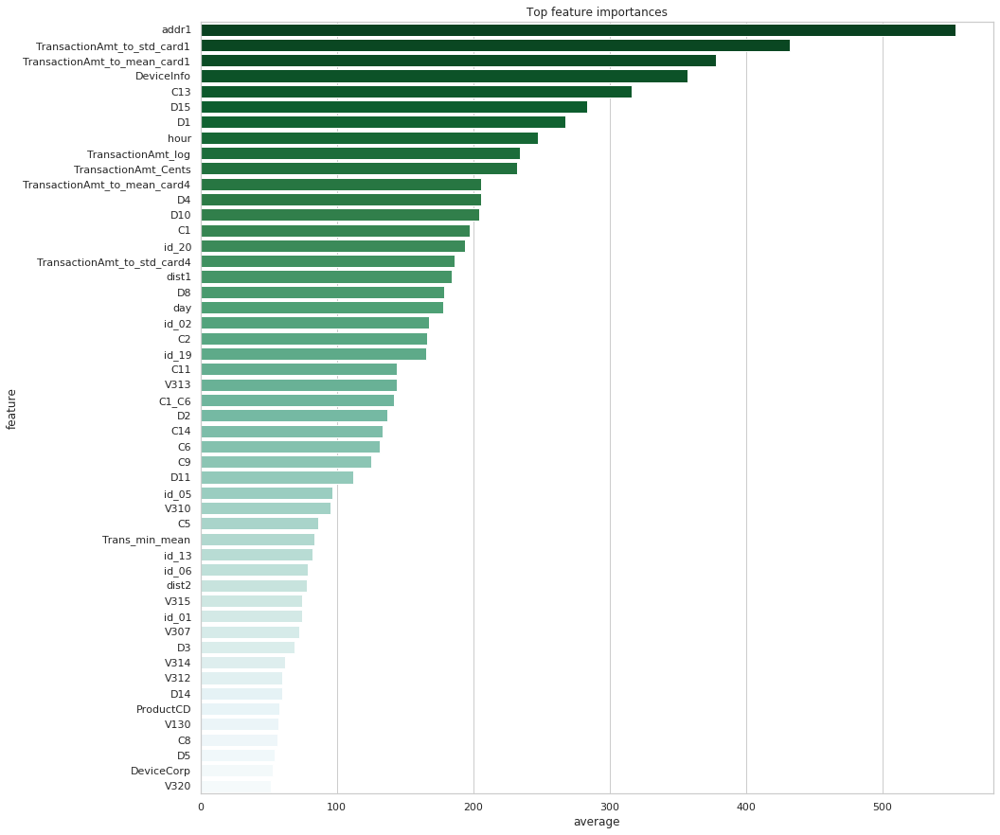

In [ ]:
plt.figure(figsize=(15, 15))
sns.barplot(data=feature_importances.sort_values(by='average', ascending=False).head(50), x='average', y='feature', palette="BuGn_r")
plt.title('Top feature importances')
plt.show()

#### **LightGBM with cross-validation без настройки параметров**


In [ ]:
X_train = df_train.drop(columns =['isFraud'])
y_train = df_train['isFraud']

In [ ]:
%%time

model = LGBMClassifier()
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=2, random_state=1)
n_scores = cross_val_score(model, X_train, y_train, scoring='roc_auc', cv=cv, error_score='raise')
print('CV AUC-ROС: %.5f' % (mean(n_scores)))

CV AUC-ROС: 0.92194
CPU times: user 12min 56s, sys: 7.49 s, total: 13min 4s
Wall time: 1min 58s


#### **LightGBM with cross-validation с настройкой параметров**

In [ ]:
%%time

params = {
    'objective': 'binary',
    'boosting_type': 'gbdt',
    'metric': 'auc',
    'n_jobs': 1,
    'n_estimators': 500,
    'seed': 13,
}

model = LGBMClassifier(**params, is_unbalanced=True)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=2, random_state=1)
n_scores = cross_val_score(model, X_train, y_train, scoring='roc_auc', cv=cv, n_jobs=4, error_score='raise')
print('CV AUC-ROC: %.5f' % (mean(n_scores)))

CV AUC-ROC: 0.94788
CPU times: user 199 ms, sys: 470 ms, total: 670 ms
Wall time: 7min 16s


In [ ]:
%%time

params = {
    'objective': 'binary',
    'boosting_type': 'gbdt',
    'metric': 'auc',
    'n_jobs': -1,
    'n_estimators': 200,
    'seed': 13
}

model = LGBMClassifier(**params, is_unbalanced=True)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=2, random_state=1)
n_scores = cross_val_score(model, X_train, y_train, scoring='roc_auc', cv=cv, n_jobs=1, error_score='raise')
print('CV AUC-ROC: %.5f' % (mean(n_scores)))

CV AUC-ROC: 0.93535
CPU times: user 16min 17s, sys: 6.28 s, total: 16min 24s
Wall time: 2min 21s


#### **Настройка гиперпараметров. LightGBM with GridSearchCV**

In [ ]:
params = {
    'objective': ['binary'],
    'boosting_type': ['gbdt'],
    'metric': ['auc'],
    'seed': [13],
    'early_stopping_rounds': [200],
    'learning_rate': [0.01, 0.025, 0.1],
    'n_estimators':[100, 500, 1000],
    'max_depth': [5, 10, 15],
    'is_unbalanced': [True]
}

scores = []

cv = RepeatedStratifiedKFold(n_splits=2, n_repeats=2, random_state=1)
test_preds = []

for i in range(len(folds_idx)):
    X_train = df_train.drop(folds_idx[i], axis=0)
    y_train = X_train['isFraud'].values
    X_val = df_train.loc[folds_idx[i]]
    y_val = X_val['isFraud'].values
    X_train = X_train.drop('isFraud', axis=1)
    X_val = X_val.drop('isFraud', axis=1)

    lgb_train = lgb.Dataset(X_train, y_train)
    lgb_eval = lgb.Dataset(X_val, y_val, reference=lgb_train)
    #lgb_model = lgb.train(params, lgb_train, valid_sets=lgb_eval, verbose_eval=100)
    
    g_lgbm = GridSearchCV(LGBMClassifier(), 
                             param_grid=params,
                             scoring='roc_auc', 
                             cv=cv, 
                             n_jobs=-1)
    
    lgb_model = g_lgbm.fit(X=X_train, y=y_train, eval_set = (X_val, y_val))

    y_pred = lgb_model.predict(X_val)
    score_fold = roc_auc_score(y_val, y_pred)
    scores.append(score_fold)
    y_test_pred = lgb_model.predict(df_test)
    test_preds.append(y_test_pred)

for i in range(len(scores)):
    print('Fold {}, AUC-ROC: {:.5f}'.format(i, scores[i]))
print('CV AUC-ROC: {:.5f}'.format(np.mean(scores)))

[1]	valid_0's auc: 0.789366
Training until validation scores don't improve for 200 rounds.
[2]	valid_0's auc: 0.802344
[3]	valid_0's auc: 0.814597
[4]	valid_0's auc: 0.821196
[5]	valid_0's auc: 0.821648
[6]	valid_0's auc: 0.826688
[7]	valid_0's auc: 0.829627
[8]	valid_0's auc: 0.83206
[9]	valid_0's auc: 0.833257
[10]	valid_0's auc: 0.835576
[11]	valid_0's auc: 0.838089
[12]	valid_0's auc: 0.839738
[13]	valid_0's auc: 0.842462
[14]	valid_0's auc: 0.845406
[15]	valid_0's auc: 0.846381
[16]	valid_0's auc: 0.847021
[17]	valid_0's auc: 0.84767
[18]	valid_0's auc: 0.848585
[19]	valid_0's auc: 0.848773
[20]	valid_0's auc: 0.84933
[21]	valid_0's auc: 0.851877
[22]	valid_0's auc: 0.852344
[23]	valid_0's auc: 0.853817
[24]	valid_0's auc: 0.853649
[25]	valid_0's auc: 0.854593
[26]	valid_0's auc: 0.854522
[27]	valid_0's auc: 0.854959
[28]	valid_0's auc: 0.855343
[29]	valid_0's auc: 0.855654
[30]	valid_0's auc: 0.857168
[31]	valid_0's auc: 0.858357
[32]	valid_0's auc: 0.859663
[33]	valid_0's auc: 0

In [ ]:
top_par = lgb_model.best_params_
top_par

{'boosting_type': 'gbdt',
 'early_stopping_rounds': 200,
 'is_unbalanced': True,
 'learning_rate': 0.025,
 'max_depth': 10,
 'metric': 'auc',
 'n_estimators': 1000,
 'objective': 'binary',
 'seed': 13}

### Финальная модель с использование бест парамс

{'boosting_type': 'gbdt',
 'early_stopping_rounds': 200,
 'is_unbalanced': True,
 'learning_rate': 0.025,
 'max_depth': 10,
 'metric': 'auc',
 'n_estimators': 1000,
 'objective': 'binary',
 'seed': 13}

Часть данных сделаем для итоговой оценки модели, так как в это соревнование нельзя сабмитить.

Разобьем фолды повторно, так как выборка поменялась (хотя данные должны были выкинуться равномерно с каждого фолда).

In [ ]:
X_train_c.loc[~X_train_c.index.isin(fold0_idx)]

,ProductCD,addr1,addr2,dist1,dist2,C1,C2,C3,C4,C5,...,same_emaildomain,DeviceCorp,Trans_min_mean,Trans_min_std,TransactionAmt_to_mean_card1,TransactionAmt_to_mean_card4,TransactionAmt_to_std_card1,TransactionAmt_to_std_card4,M1_M9,C1_C6
344981,4,315,87,65535,65535,1,1,0,0,1,...,1,24,2315.475830,10.165877,10.919790,18.637619,6.642443,10.720262,35,1596
67450,1,299,87,65535,65535,1,1,0,1,0,...,1,9,15.485748,0.067989,0.865247,1.130421,0.645053,0.669169,34,1595
364971,4,264,87,2,65535,3,5,0,0,6,...,1,24,-107.564255,-0.472251,0.333995,0.203099,0.258757,0.120227,35,1595
83845,4,264,87,21,65535,3,3,0,0,1,...,1,24,75.435745,0.331193,2.064995,1.597136,1.789022,0.918665,35,1596
112111,1,272,87,65535,65535,2,2,0,1,0,...,1,25,-34.514252,-0.151532,0.512149,0.753614,0.354612,0.446112,34,1596
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73349,4,325,87,65535,65535,3,2,0,0,1,...,1,24,-100.424255,-0.440903,0.174592,0.256907,0.120887,0.152080,35,1596
371405,1,184,87,65535,65535,1,1,0,0,0,...,0,25,-84.514252,-0.371052,0.568476,0.376807,0.671513,0.223056,34,1595
312203,4,204,87,5,65535,5,2,0,0,0,...,0,24,-104.514252,-0.458860,0.215966,0.228217,0.129513,0.131269,35,1596
267336,4,123,87,65535,65535,1,1,0,0,0,...,0,24,6.485748,0.028475,0.380476,1.072618,0.305246,0.616965,35,1595


In [ ]:
# Для оценки качества возьмём часть данных, так как в этом соревновании нельзя сабмитить предсказание
from sklearn.model_selection import train_test_split
X_train_c, X_check_c, y_train_c, y_check_c = train_test_split(df_train.drop(columns=['isFraud']), df_train['isFraud'], test_size=0.25, random_state=1)

step = int(np.ceil(len(X_train_c)/4))
#выделим фолды для валидации
fold0_idx = X_train_c.iloc[step*0:step*1].index
fold1_idx = X_train_c.iloc[step*1:step*2].index
fold2_idx = X_train_c.iloc[step*2:step*3].index
fold3_idx = X_train_c.iloc[step*3:step*4].index
print('Validation set 0 length:', len(fold0_idx))
print('Validation set 1 length:', len(fold1_idx))
print('Validation set 2 length:', len(fold2_idx))
print('Validation set 3 length:', len(fold3_idx))

folds_idx = [fold0_idx, fold1_idx, fold2_idx, fold3_idx]

Validation set 0 length: 78292
Validation set 1 length: 78292
Validation set 2 length: 78292
Validation set 3 length: 78291


In [ ]:
scores = []

feature_importances = pd.DataFrame()
feature_importances['feature'] = df_train.columns.drop('isFraud')

for i in folds_idx:
    X_train = X_train_c.loc[~X_train_c.index.isin(i)]
    y_train = y_train_c.loc[~y_train_c.index.isin(i)]
    X_val = X_train_c.loc[i]
    y_val = y_train_c.loc[i]

    lgb_train = lgb.Dataset(X_train, y_train)
    lgb_eval = lgb.Dataset(X_val, y_val, reference=lgb_train)
    lgb_model_finall = lgb.train(top_par, lgb_train, valid_sets=lgb_eval, verbose_eval=100)
    
    feature_importances['fold_{}'.format(i)] = lgb_model_finall.feature_importance()

    y_pred = lgb_model_finall.predict(X_val)
    score_fold = roc_auc_score(y_val, y_pred)
    scores.append(score_fold)

for i in range(len(scores)):
    print('Fold {}, AUC-ROC: {:.5f}'.format(i, scores[i]))
print('CV AUC-ROC: {:.5f}'.format(np.mean(scores)))

Training until validation scores don't improve for 200 rounds.
[100]	valid_0's auc: 0.896522
[200]	valid_0's auc: 0.911301
[300]	valid_0's auc: 0.917445
[400]	valid_0's auc: 0.921651
[500]	valid_0's auc: 0.924549
[600]	valid_0's auc: 0.927463
[700]	valid_0's auc: 0.929836
[800]	valid_0's auc: 0.93196
[900]	valid_0's auc: 0.933293
[1000]	valid_0's auc: 0.934549
Did not meet early stopping. Best iteration is:
[1000]	valid_0's auc: 0.934549
Training until validation scores don't improve for 200 rounds.
[100]	valid_0's auc: 0.887851
[200]	valid_0's auc: 0.901363
[300]	valid_0's auc: 0.909083
[400]	valid_0's auc: 0.914434
[500]	valid_0's auc: 0.917819
[600]	valid_0's auc: 0.920715
[700]	valid_0's auc: 0.922623
[800]	valid_0's auc: 0.92497
[900]	valid_0's auc: 0.926836
[1000]	valid_0's auc: 0.928356
Did not meet early stopping. Best iteration is:
[1000]	valid_0's auc: 0.928356
Training until validation scores don't improve for 200 rounds.
[100]	valid_0's auc: 0.892603
[200]	valid_0's auc: 0.

Итоговый ROC_AUC на чистых данных

In [ ]:
print('Finally AUC-ROC: {:.5f}'.format(roc_auc_score(y_check_c,
                                                     lgb_model_finall.predict(X_check_c)
                                                    )))

Finally AUC-ROC: 0.93466


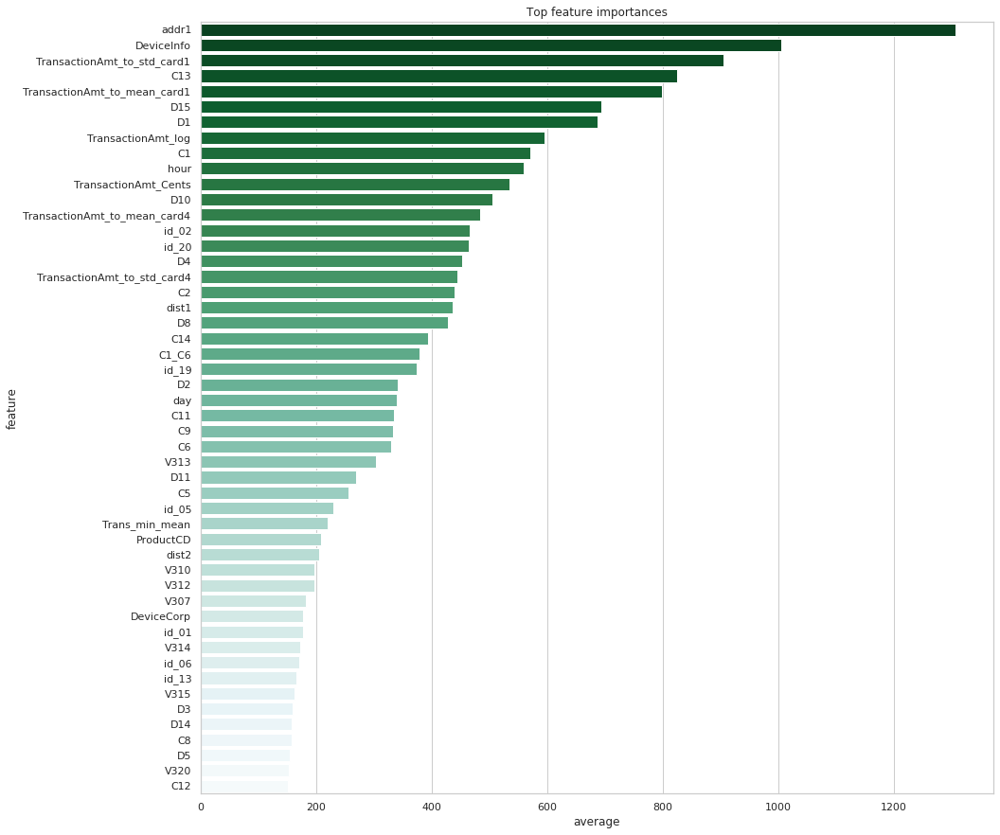

In [ ]:
fold_cols = [col for col in feature_importances.columns if col.startswith('fold_')]
feature_importances['average'] = feature_importances[fold_cols].mean(axis=1)

plt.figure(figsize=(15, 15))
sns.barplot(data=feature_importances.sort_values(by='average', ascending=False).head(50), x='average', y='feature', palette="BuGn_r")
plt.title('Top feature importances')
plt.show()

#### **CatBoost**

In [ ]:
cat_features = ['ProductCD',
                'addr1', 'addr2',
                'DeviceType', 'DeviceInfo',
                'id_12', 'id_13', 'id_14', 'id_15', 'id_16',
                'id_17', 'id_18', 'id_19', 'id_20', 'id_21',
                'id_22', 'id_25', 'id_26',
                'id_29',
                'id_32', 'id_36',
                'id_37', 'id_38',
                'froud_probability', 'DeviceCorp',
                'M1_M9', 'C1_C6']

In [ ]:
scores = []

feature_importances = pd.DataFrame()
feature_importances['feature'] = df_train.columns.drop('isFraud')

test_preds = []

for i in range(len(folds_idx)):
    X_train = df_train.drop(folds_idx[i], axis=0)
    y_train = X_train['isFraud'].values
    X_val = df_train.loc[folds_idx[i]]
    y_val = X_val['isFraud'].values
    X_train = X_train.drop('isFraud', axis=1)
    X_val = X_val.drop('isFraud', axis=1)

    train_pool = catboost.Pool(
    X_train,
    label=y_train,
    cat_features=cat_features)

    val_pool = catboost.Pool(
    X_val,
    label=y_val,
    cat_features=cat_features)

    clf = catboost.CatBoostClassifier(
        eval_metric='AUC',
        od_pval=0.05,
        od_wait=20,
        # early_stopping_rounds=20,
        random_seed=13,
        # task_type='CPU',
        task_type='GPU')

    clf.fit(
        train_pool, 
        eval_set=val_pool,
        plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.141164
0:	learn: 0.7413048	test: 0.6462264	best: 0.6462264 (0)	total: 66.6ms	remaining: 1m 6s
1:	learn: 0.7424178	test: 0.6409155	best: 0.6462264 (0)	total: 131ms	remaining: 1m 5s
2:	learn: 0.8048298	test: 0.7295115	best: 0.7295115 (2)	total: 187ms	remaining: 1m 2s
3:	learn: 0.7931469	test: 0.6982871	best: 0.7295115 (2)	total: 248ms	remaining: 1m 1s
4:	learn: 0.7945339	test: 0.6989441	best: 0.7295115 (2)	total: 302ms	remaining: 1m
5:	learn: 0.8175322	test: 0.7386756	best: 0.7386756 (5)	total: 359ms	remaining: 59.5s
6:	learn: 0.8291678	test: 0.7518257	best: 0.7518257 (6)	total: 416ms	remaining: 59s
7:	learn: 0.8407841	test: 0.7659512	best: 0.7659512 (7)	total: 469ms	remaining: 58.1s
8:	learn: 0.8413195	test: 0.7691964	best: 0.7691964 (8)	total: 529ms	remaining: 58.2s
9:	learn: 0.8457823	test: 0.7716352	best: 0.7716352 (9)	total: 591ms	remaining: 58.5s
10:	learn: 0.8508561	test: 0.7740163	best: 0.7740163 (10)	total: 652ms	remaining: 58.6s
11:	learn: 0.8549476	test:

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.143364
0:	learn: 0.6849779	test: 0.7248477	best: 0.7248477 (0)	total: 74.3ms	remaining: 1m 14s
1:	learn: 0.6937369	test: 0.7292245	best: 0.7292245 (1)	total: 146ms	remaining: 1m 12s
2:	learn: 0.7830764	test: 0.8137243	best: 0.8137243 (2)	total: 207ms	remaining: 1m 8s
3:	learn: 0.7857108	test: 0.8164571	best: 0.8164571 (3)	total: 265ms	remaining: 1m 5s
4:	learn: 0.8017497	test: 0.8197698	best: 0.8197698 (4)	total: 331ms	remaining: 1m 5s
5:	learn: 0.8191389	test: 0.8341950	best: 0.8341950 (5)	total: 400ms	remaining: 1m 6s
6:	learn: 0.8318894	test: 0.8400597	best: 0.8400597 (6)	total: 468ms	remaining: 1m 6s
7:	learn: 0.8325026	test: 0.8412853	best: 0.8412853 (7)	total: 537ms	remaining: 1m 6s
8:	learn: 0.8558767	test: 0.8478247	best: 0.8478247 (8)	total: 603ms	remaining: 1m 6s
9:	learn: 0.8591807	test: 0.8504076	best: 0.8504076 (9)	total: 672ms	remaining: 1m 6s
10:	learn: 0.8598556	test: 0.8543507	best: 0.8543507 (10)	total: 742ms	remaining: 1m 6s
11:	learn: 0.861542

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.143236
0:	learn: 0.7157165	test: 0.7342475	best: 0.7342475 (0)	total: 72.2ms	remaining: 1m 12s
1:	learn: 0.7183576	test: 0.7458618	best: 0.7458618 (1)	total: 143ms	remaining: 1m 11s
2:	learn: 0.7855847	test: 0.8115908	best: 0.8115908 (2)	total: 208ms	remaining: 1m 9s
3:	learn: 0.7847871	test: 0.8108963	best: 0.8115908 (2)	total: 271ms	remaining: 1m 7s
4:	learn: 0.7970073	test: 0.8169736	best: 0.8169736 (4)	total: 337ms	remaining: 1m 7s
5:	learn: 0.8122979	test: 0.8314703	best: 0.8314703 (5)	total: 407ms	remaining: 1m 7s
6:	learn: 0.8411521	test: 0.8527004	best: 0.8527004 (6)	total: 473ms	remaining: 1m 7s
7:	learn: 0.8450786	test: 0.8556097	best: 0.8556097 (7)	total: 541ms	remaining: 1m 7s
8:	learn: 0.8481632	test: 0.8602155	best: 0.8602155 (8)	total: 609ms	remaining: 1m 7s
9:	learn: 0.8571702	test: 0.8670261	best: 0.8670261 (9)	total: 668ms	remaining: 1m 6s
10:	learn: 0.8601097	test: 0.8700854	best: 0.8700854 (10)	total: 736ms	remaining: 1m 6s
11:	learn: 0.861420

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.142793
0:	learn: 0.6882913	test: 0.7057374	best: 0.7057374 (0)	total: 72.2ms	remaining: 1m 12s
1:	learn: 0.7022132	test: 0.7106940	best: 0.7106940 (1)	total: 138ms	remaining: 1m 8s
2:	learn: 0.7256755	test: 0.7256154	best: 0.7256154 (2)	total: 193ms	remaining: 1m 4s
3:	learn: 0.7921350	test: 0.7631482	best: 0.7631482 (3)	total: 249ms	remaining: 1m 2s
4:	learn: 0.7915230	test: 0.7637013	best: 0.7637013 (4)	total: 314ms	remaining: 1m 2s
5:	learn: 0.8226044	test: 0.7896293	best: 0.7896293 (5)	total: 380ms	remaining: 1m 2s
6:	learn: 0.8390598	test: 0.8082768	best: 0.8082768 (6)	total: 443ms	remaining: 1m 2s
7:	learn: 0.8572989	test: 0.8310741	best: 0.8310741 (7)	total: 509ms	remaining: 1m 3s
8:	learn: 0.8608024	test: 0.8392497	best: 0.8392497 (8)	total: 567ms	remaining: 1m 2s
9:	learn: 0.8615849	test: 0.8391320	best: 0.8392497 (8)	total: 627ms	remaining: 1m 2s
10:	learn: 0.8648183	test: 0.8439537	best: 0.8439537 (10)	total: 699ms	remaining: 1m 2s
11:	learn: 0.8656338

### **С удалением высоко коррелирующих признаков**

#### **LightGBM with cross-validation без настройки параметров**


In [ ]:
X_train_without_hicorr = df_train_without_hicorr.drop(columns =['isFraud'])
y_train_without_hicorr = df_train_without_hicorr['isFraud']

In [ ]:
%%time

model_without_hicorr = LGBMClassifier()
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=2, random_state=1)
n_scores = cross_val_score(model_without_hicorr, X_train_without_hicorr, y_train_without_hicorr, scoring='roc_auc', cv=cv, error_score='raise')
print('CV AUC-ROС: %.5f' % (mean(n_scores)))

CV AUC-ROС: 0.90174
CPU times: user 2min 20s, sys: 185 ms, total: 2min 20s
Wall time: 19.8 s


#### **LightGBM with cross-validation с настройкой параметров**

In [ ]:
%%time

params = {
    'objective': 'binary',
    'boosting_type': 'gbdt',
    'metric': 'auc',
    'n_jobs': -1,
    'n_estimators': 2000,
    'seed': 13,
}

model_without_hicorr = LGBMClassifier(**params, is_unbalanced=True)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=2, random_state=1)
n_scores = cross_val_score(model_without_hicorr, X_train_without_hicorr, y_train_without_hicorr, scoring='roc_auc', cv=cv, error_score='raise')
print('CV AUC-ROC: %.5f' % (mean(n_scores)))

CV AUC-ROC: 0.94557
CPU times: user 18min 49s, sys: 1.26 s, total: 18min 50s
Wall time: 2min 24s


In [ ]:
%%time

params = {
    'objective': 'binary',
    'boosting_type': 'gbdt',
    'metric': 'auc',
    'n_jobs': -1,
    'n_estimators': 200,
    'seed': 13
}

model_without_hicorr = LGBMClassifier(**params, is_unbalanced=True)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=2, random_state=1)
n_scores = cross_val_score(model_without_hicorr, X_train_without_hicorr, y_train_without_hicorr, scoring='roc_auc', cv=cv, n_jobs=-1, error_score='raise')
print('CV AUC-ROC: %.5f' % (mean(n_scores)))

CV AUC-ROC: 0.91205
CPU times: user 227 ms, sys: 597 ms, total: 825 ms
Wall time: 38.1 s


# Финальный анализ

In [ ]:
import shap

shap_values = shap.TreeExplainer(lgb_model_finall).shap_values(X_check_c.iloc[:1000])

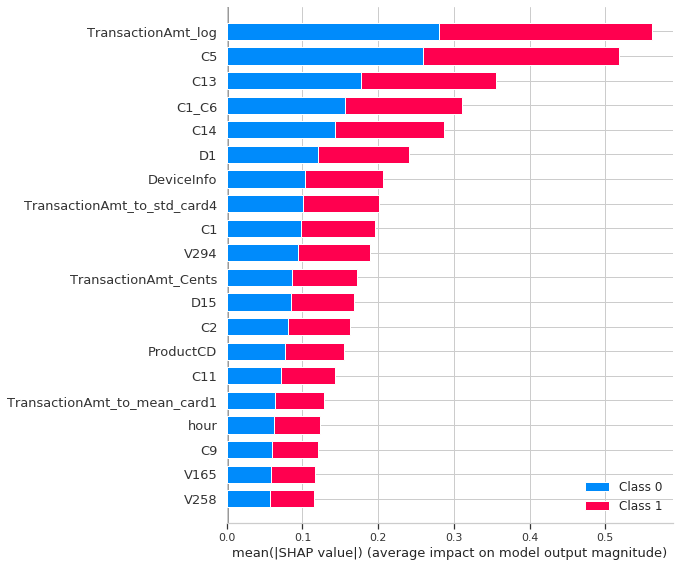

In [ ]:
shap.summary_plot(shap_values, X_check_c.iloc[:1000])

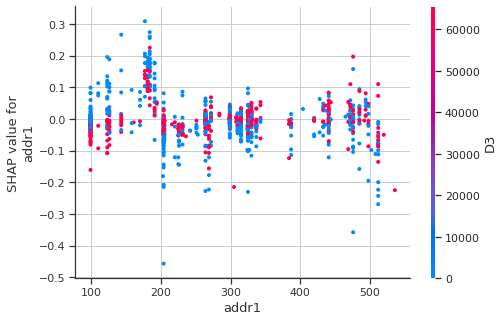

In [ ]:
shap.dependence_plot("addr1", shap_values[0], X_check_c.iloc[:1000])